In [1]:
# ============================================================
# CELL 1 — GPU check + install packages
# ============================================================


!pip install ultralytics==8.2.0 -q
!pip install pycocotools -q
!pip install pyyaml -q

import torch
print(f"\n PyTorch  : {torch.__version__}")
print(f"   CUDA     : {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"   GPU      : {torch.cuda.get_device_name(0)}")
    vram = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f"   VRAM     : {vram:.1f} GB")
    # Kaggle T4 x2 = 32 GB total
    DEVICE     = "0"
    BATCH_SIZE = 8
    print(f"   Batch    : {BATCH_SIZE}")
print(" All packages installed")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.8/750.8 kB 28.2 MB/s eta 0:00:00

 PyTorch  : 2.10.0+cu128
   CUDA     : True
   GPU      : Tesla T4
   VRAM     : 15.6 GB
   Batch    : 8
 All packages installed


In [2]:
# ============================================================
# CELL 2 — Find and extract filtered_tiny zip from Kaggle input
# ============================================================

import os
import zipfile
from pathlib import Path

# ── Find the uploaded zip ─────────────────────────────────────
INPUT_DIR = Path("/kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images")
WORK_DIR  = Path("/kaggle/working")

print(" Contents of /kaggle/input:")
for item in INPUT_DIR.rglob("*"):
    print(f"   {item}")

# Find zip file
zip_files = list(INPUT_DIR.rglob("*.zip"))
print(f"\n🔍 Zip files found: {len(zip_files)}")
for z in zip_files:
    print(f"   {z}")

 Contents of /kaggle/input:
   /kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images/filtered_tiny
   /kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images/filtered_tiny/labels
   /kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images/filtered_tiny/val_images
   /kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images/filtered_tiny/val_labels
   /kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images/filtered_tiny/images
   /kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images/filtered_tiny/labels/0000348_02157_d_0000417.txt
   /kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images/filtered_tiny/labels/9999966_00000_d_0000137.txt
   /kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images/filtered_tiny/labels/0000180_00806_d_0000023.txt
   /kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images

In [3]:
# ============================================================
# CELL 5 — Set paths based on what Cell 4 showed
#
# Your filtered_tiny zip has:
#   images/  → training images
#   labels/  → training labels
#   val_images/ → val images
#   val_labels/ → val labels
#
# If your structure is different, update paths below
# ============================================================

from pathlib import Path

EXTRACT_TO = Path("/kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images/filtered_tiny")

# ── Auto-detect train/val image and label dirs ────────────────
def find_dir(base, candidates):
    """Return first existing directory from candidates list."""
    for name in candidates:
        p = base / name
        if p.exists() and len(list(p.glob("*"))) > 0:
            return p
    # fallback: search recursively
    for name in candidates:
        results = list(base.rglob(name))
        if results:
            return results[0]
    return None

TRAIN_IMG = find_dir(EXTRACT_TO, ["images", "train/images", "train_images"])
TRAIN_LBL = find_dir(EXTRACT_TO, ["labels", "train/labels", "train_labels"])
VAL_IMG   = find_dir(EXTRACT_TO, ["val_images", "val/images"])
VAL_LBL   = find_dir(EXTRACT_TO, ["val_labels", "val/labels"])

print(" Detected paths:")
print(f"   TRAIN images : {TRAIN_IMG}")
print(f"   TRAIN labels : {TRAIN_LBL}")
print(f"   VAL   images : {VAL_IMG}")
print(f"   VAL   labels : {VAL_LBL}")

# Count files
for name, path in [("TRAIN img", TRAIN_IMG), ("TRAIN lbl", TRAIN_LBL),
                    ("VAL img",   VAL_IMG),   ("VAL lbl",   VAL_LBL)]:
    if path:
        n = len(list(path.glob("*.jpg"))) + \
            len(list(path.glob("*.png"))) + \
            len(list(path.glob("*.txt")))
        print(f"   {name:12s}: {n} files")
    else:
        print(f"   {name:12s}:  NOT FOUND")

 Detected paths:
   TRAIN images : /kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images/filtered_tiny/images
   TRAIN labels : /kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images/filtered_tiny/labels
   VAL   images : /kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images/filtered_tiny/val_images
   VAL   labels : /kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images/filtered_tiny/val_labels
   TRAIN img   : 658 files
   TRAIN lbl   : 658 files
   VAL img     : 60 files
   VAL lbl     : 60 files


In [4]:
# ============================================================
# CELL 6 — Detect label format (YOLO vs VisDrone)
# YOLO format   : "class cx cy w h"  (5 values, space separated)
# VisDrone format: "x,y,w,h,score,cat,trunc,occ" (8 values, comma)
# ============================================================

from pathlib import Path

sample_txts = list(TRAIN_LBL.glob("*.txt"))[:3]

print("Checking label format (first 3 files):\n")

FORMAT = None

for txt_path in sample_txts:
    with open(txt_path) as f:
        lines = [l.strip() for l in f.readlines() if l.strip()]
    print(f"File: {txt_path.name}")
    for line in lines[:3]:
        print(f"  '{line}'")
    if lines:
        first = lines[0]
        if "," in first:
            FORMAT = "visdrone"
            print("  → VisDrone format detected (comma separated)\n")
        else:
            FORMAT = "yolo"
            print("  → YOLO format detected (space separated)\n")

print(f"Label format: {FORMAT.upper()}")
print(f"   {'Need conversion to YOLO' if FORMAT == 'visdrone' else 'Ready to use — no conversion needed'}")

Checking label format (first 3 files):

File: 0000348_02157_d_0000417.txt
  '234,358,17,37,1,1,0,0'
  '248,377,11,22,1,1,0,0'
  '650,149,11,20,1,1,0,0'
  → VisDrone format detected (comma separated)

File: 9999966_00000_d_0000137.txt
  '239,770,92,93,1,1,0,0'
  '1202,924,109,87,1,1,0,0'
  '1256,872,65,94,1,2,0,1'
  → VisDrone format detected (comma separated)

File: 0000180_00806_d_0000023.txt
  '919,323,84,30,1,4,0,0'
  '1081,285,62,22,1,4,0,1'
  '957,633,96,56,1,4,0,1'
  → VisDrone format detected (comma separated)

Label format: VISDRONE
   Need conversion to YOLO


In [5]:
# ============================================================
# CELL 7 — Convert VisDrone → YOLO format if needed
# If Cell 6 showed YOLO format already, this cell still runs
# safely but skips conversion
# ============================================================

import cv2
import shutil
from pathlib import Path
from tqdm.notebook import tqdm

WORK_DIR   = Path("/kaggle/working")
DATASET    = WORK_DIR / "dataset_yolo"

# Category definitions
TINY_CATEGORIES = {1, 2, 3, 4, 7, 10}
CAT_TO_YOLO     = {1:0, 2:1, 3:2, 4:3, 7:4, 10:5}
YOLO_NAMES      = {0:"pedestrian", 1:"people",   2:"bicycle",
                   3:"car",        4:"tricycle",  5:"motor"}
TINY_MAX_AREA   = 32 * 32 * 64   # already 8× zoomed images

def convert_visdrone_to_yolo(ann_path, img_path, out_path):
    img = cv2.imread(str(img_path))
    if img is None:
        return 0
    H, W = img.shape[:2]
    lines_out = []
    with open(ann_path) as f:
        for line in f:
            p = line.strip().split(",")
            if len(p) < 6:
                continue
            x, y, w, h = int(p[0]), int(p[1]), int(p[2]), int(p[3])
            cat = int(p[5])
            if cat not in TINY_CATEGORIES:
                continue
            if w * h > TINY_MAX_AREA:
                continue
            x  = max(0, min(x, W-1));  y  = max(0, min(y, H-1))
            w  = max(1, min(w, W-x));  h  = max(1, min(h, H-y))
            cx = (x + w/2) / W;        cy = (y + h/2) / H
            wn = w / W;                hn = h / H
            lines_out.append(
                f"{CAT_TO_YOLO[cat]} {cx:.6f} {cy:.6f} {wn:.6f} {hn:.6f}")
    with open(out_path, "w") as f:
        f.write("\n".join(lines_out))
    return len(lines_out)


def copy_yolo_label(src, dst):
    shutil.copy(src, dst)


for split, img_dir, lbl_dir in [
    ("train", TRAIN_IMG, TRAIN_LBL),
    ("val",   VAL_IMG,   VAL_LBL),
]:
    out_img = DATASET / split / "images"
    out_lbl = DATASET / split / "labels"
    out_img.mkdir(parents=True, exist_ok=True)
    out_lbl.mkdir(parents=True, exist_ok=True)

    img_files = list(img_dir.glob("*.jpg")) + list(img_dir.glob("*.png"))
    print(f"\n🔄 Processing {split}: {len(img_files)} images")

    skipped = 0
    for img_path in tqdm(img_files, desc=f"  {split}"):
        # Find matching label
        lbl_path = lbl_dir / (img_path.stem + ".txt")
        if not lbl_path.exists():
            skipped += 1
            continue

        # Copy image
        dst_img = out_img / (img_path.stem + ".jpg")
        img_data = cv2.imread(str(img_path))
        if img_data is None:
            skipped += 1
            continue
        cv2.imwrite(str(dst_img), img_data)

        # Convert or copy label
        dst_lbl = out_lbl / (img_path.stem + ".txt")
        if FORMAT == "visdrone":
            convert_visdrone_to_yolo(lbl_path, img_path, dst_lbl)
        else:
            copy_yolo_label(lbl_path, dst_lbl)

    n_img = len(list(out_img.glob("*.jpg")))
    n_lbl = len(list(out_lbl.glob("*.txt")))
    print(f"    images: {n_img}   labels: {n_lbl}   skipped: {skipped}")

print(f"\n Dataset ready at {DATASET}")


🔄 Processing train: 658 images


  train:   0%|          | 0/658 [00:00<?, ?it/s]

    images: 658   labels: 658   skipped: 0

🔄 Processing val: 60 images


  val:   0%|          | 0/60 [00:00<?, ?it/s]

    images: 60   labels: 60   skipped: 0

 Dataset ready at /kaggle/working/dataset_yolo


In [6]:
# ============================================================
# CELL 8 — Create YAML file for RT-DETR
# ============================================================

import yaml
from pathlib import Path

WORK_DIR = Path("/kaggle/working")
DATASET  = WORK_DIR / "dataset_yolo"

YOLO_NAMES = {0:"pedestrian", 1:"people",  2:"bicycle",
              3:"car",        4:"tricycle", 5:"motor"}

yaml_data = {
    "path"  : str(DATASET),
    "train" : "train/images",
    "val"   : "val/images",
    "nc"    : 6,
    "names" : [YOLO_NAMES[i] for i in range(6)]
}

YAML_PATH = WORK_DIR / "visdrone_tiny.yaml"
with open(YAML_PATH, "w") as f:
    yaml.dump(yaml_data, f, default_flow_style=False)

print(" Dataset YAML created:")
print(open(YAML_PATH).read())

# Final count
train_imgs = len(list((DATASET/"train"/"images").glob("*.jpg")))
val_imgs   = len(list((DATASET/"val"  /"images").glob("*.jpg")))
train_lbls = len(list((DATASET/"train"/"labels").glob("*.txt")))
val_lbls   = len(list((DATASET/"val"  /"labels").glob("*.txt")))

print(f"📊 Dataset summary:")
print(f"   Train : {train_imgs} images  {train_lbls} labels")
print(f"   Val   : {val_imgs}   images  {val_lbls}   labels")

 Dataset YAML created:
names:
- pedestrian
- people
- bicycle
- car
- tricycle
- motor
nc: 6
path: /kaggle/working/dataset_yolo
train: train/images
val: val/images

📊 Dataset summary:
   Train : 658 images  658 labels
   Val   : 60   images  60   labels


In [7]:
# ============================================================
# FIX CELL — Solve PyTorch 2.6 UnpicklingError
# Root cause: ultralytics 8.1.0 uses old torch.load() call
# Fix: upgrade ultralytics to latest which handles PyTorch 2.6
# ============================================================

# Step 1 — Upgrade ultralytics
!pip install ultralytics --upgrade -q

# Step 2 — Verify version
import ultralytics
print(f" Ultralytics version: {ultralytics.__version__}")

# Step 3 — Add ALL required safe globals for PyTorch 2.6
import torch
import torch.serialization
import torch.nn

# Add every class that RT-DETR weights need
safe_classes = []

try:
    import ultralytics.nn.tasks as ult_tasks
    safe_classes += [
        ult_tasks.DetectionModel,
        ult_tasks.RTDETRDetectionModel,
    ]
except Exception as e:
    print(f" ultralytics tasks: {e}")

try:
    import torch.nn as nn
    safe_classes += [
        nn.modules.container.Sequential,
        nn.ModuleList,
        nn.ModuleDict,
    ]
except Exception as e:
    print(f" torch.nn: {e}")

try:
    import ultralytics.nn.modules
    safe_classes += [
        ultralytics.nn.modules.conv.Conv,
        ultralytics.nn.modules.block.C2f,
    ]
except Exception as e:
    print(f" ultralytics modules: {e}")

torch.serialization.add_safe_globals(safe_classes)
print(f" Added {len(safe_classes)} safe globals")

# Step 4 — Delete cached broken weights and re-download fresh
import os
broken_weights = "rtdetr-l.pt"
if os.path.exists(broken_weights):
    os.remove(broken_weights)
    print(f" Deleted cached {broken_weights} — will re-download fresh")

print("\n Fix applied — now run Cell 9")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 51.5 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
 Ultralytics version: 8.4.53
 Added 7 safe globals

 Fix applied — now run Cell 9


In [8]:
# ============================================================
# CELL 9B — Apply 8× bicubic zoom on Kaggle images
# ~15 mins on T4
# ============================================================

import cv2
import shutil
from pathlib import Path
from tqdm.notebook import tqdm

WORK_DIR   = Path("/kaggle/working")
DATASET    = WORK_DIR / "dataset_yolo"
ZOOM_DIR   = WORK_DIR / "dataset_zoomed"

for split in ["train", "val"]:
    (ZOOM_DIR / split / "images").mkdir(parents=True, exist_ok=True)
    (ZOOM_DIR / split / "labels").mkdir(parents=True, exist_ok=True)

FACTOR = 8

for split in ["train", "val"]:
    img_dir  = DATASET / split / "images"
    lbl_dir  = DATASET / split / "labels"
    out_img  = ZOOM_DIR / split / "images"
    out_lbl  = ZOOM_DIR / split / "labels"
    img_list = list(img_dir.glob("*.jpg"))

    print(f"\n Zooming {split}: {len(img_list)} images at {FACTOR}×")

    for img_path in tqdm(img_list, desc=f"Zoom {split}"):
        img = cv2.imread(str(img_path))
        if img is None:
            continue
        H, W   = img.shape[:2]
        zoomed = cv2.resize(img, (W * FACTOR, H * FACTOR),
                            interpolation=cv2.INTER_CUBIC)
        cv2.imwrite(str(out_img / img_path.name), zoomed)

        lbl_src = lbl_dir / (img_path.stem + ".txt")
        if lbl_src.exists():
            shutil.copy(lbl_src, out_lbl / lbl_src.name)

    n_imgs = len(list(out_img.glob("*.jpg")))
    n_lbls = len(list(out_lbl.glob("*.txt")))
    print(f"    images: {n_imgs}   labels: {n_lbls}")

# Verify zoomed size
sample = list((ZOOM_DIR/"train"/"images").glob("*.jpg"))[0]
img    = cv2.imread(str(sample))
print(f"\n Zoomed size   : {img.shape[1]} × {img.shape[0]}")
print(f"   Expected      : {960*FACTOR} × {540*FACTOR}")
print(f"   Original was  : 960 × 540")


 Zooming train: 658 images at 8×


Zoom train:   0%|          | 0/658 [00:00<?, ?it/s]

    images: 658   labels: 658

 Zooming val: 60 images at 8×


Zoom val:   0%|          | 0/60 [00:00<?, ?it/s]

    images: 60   labels: 60

 Zoomed size   : 11200 × 8400
   Expected      : 7680 × 4320
   Original was  : 960 × 540


In [9]:
# ============================================================
# CELL 9C — Create YAML for zoomed dataset
# ============================================================

import yaml
from pathlib import Path

WORK_DIR  = Path("/kaggle/working")
ZOOM_DIR  = WORK_DIR / "dataset_zoomed"

yaml_data = {
    "path"  : str(ZOOM_DIR),
    "train" : "train/images",
    "val"   : "val/images",
    "nc"    : 6,
    "names" : ["pedestrian", "people", "bicycle",
               "car", "tricycle", "motor"]
}

ZOOM_YAML = WORK_DIR / "visdrone_zoomed.yaml"
with open(ZOOM_YAML, "w") as f:
    yaml.dump(yaml_data, f, default_flow_style=False)

train_n = len(list((ZOOM_DIR/"train"/"images").glob("*.jpg")))
val_n   = len(list((ZOOM_DIR/"val"  /"images").glob("*.jpg")))

print(" YAML created:")
print(open(ZOOM_YAML).read())
print(f"   Train : {train_n} images")
print(f"   Val   : {val_n}   images")

 YAML created:
names:
- pedestrian
- people
- bicycle
- car
- tricycle
- motor
nc: 6
path: /kaggle/working/dataset_zoomed
train: train/images
val: val/images

   Train : 658 images
   Val   : 60   images


In [10]:
# ============================================================
# CELL 9D — Train RT-DETR on 8× zoomed dataset
# This is the correct training cell — replaces Cell 9
# ============================================================

import torch
from ultralytics import RTDETR
from pathlib import Path

WORK_DIR  = Path("/kaggle/working")
ZOOM_YAML = WORK_DIR / "visdrone_zoomed.yaml"

# Verify dataset exists before training
train_n = len(list((WORK_DIR/"dataset_zoomed"/"train"/"images").glob("*.jpg")))
val_n   = len(list((WORK_DIR/"dataset_zoomed"/"val"  /"images").glob("*.jpg")))
print(f" Dataset ready — train: {train_n}  val: {val_n}")

if train_n == 0:
    raise RuntimeError("Zoomed dataset empty — run Cell 9B first")

# Patch torch.load for PyTorch 2.6
_orig = torch.load
def patched_load(f, *args, **kwargs):
    kwargs["weights_only"] = False
    return _orig(f, *args, **kwargs)
torch.load = patched_load
print("torch.load patched")

# Load fresh model
model = RTDETR("rtdetr-l.pt")
print(" Model loaded")

model.train(
    data          = str(ZOOM_YAML),
    epochs        = 50,
    imgsz         = 640,
    batch         = 4,
    lr0           = 1e-4,
    optimizer     = "AdamW",
    patience      = 15,
    warmup_epochs = 5,
    device        = 0,
    project       = str(WORK_DIR / "runs"),
    name          = "rtdetr_zoomed_8x",
    exist_ok      = True,
    amp           = True,
    save          = True,
    save_period   = 5,
    workers       = 2,
    verbose       = True,
)

BEST_WEIGHTS = WORK_DIR / "runs" / "rtdetr_zoomed_8x" / "weights" / "best.pt"
print(f"\n Training complete → {BEST_WEIGHTS}")

 Dataset ready — train: 658  val: 60
torch.load patched
 Model loaded
Ultralytics 8.4.53 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/visdrone_zoomed.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=rtdetr-l.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=rtdetr_zoomed_8x, nbs=64, n

/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (132710400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (132188672 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (92629632 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (94080000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


train: Scanning /kaggle/working/dataset_zoomed/train/labels... 570 images, 0 backgrounds, 0 corrupt: 87% ━━━━━━━━━━── 570/658 952.7it/s 0.5s<0.1srequirements: Ultralytics requirement ['pi-heif'] not found, attempting AutoUpdate...
requirements: Ultralytics requirement ['pi-heif'] not found, attempting AutoUpdate...
requirements: Ultralytics requirement ['pi-heif'] not found, attempting AutoUpdate...


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (93766656 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Using Python 3.12.12 environment at: /usr
Resolved 2 packages in 222ms
Prepared 1 package in 67ms
Installed 1 package in 5ms
 + pi-heif==1.3.0

requirements: AutoUpdate success ✅ 1.0s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect

Using Python 3.12.12 environment at: /usr
Audited 1 package in 689ms

requirements: AutoUpdate success ✅ 1.0s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect

Using Python 3.12.12 environment at: /usr
Audited 1 package in 712ms

requirements: AutoUpdate success ✅ 1.0s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect

train: Scanning /kaggle/working/dataset_zoomed/train/labels... 617 images, 0 backgrounds, 41 corrupt: 100% ━━━━━━━━━━━━ 658/658 417.1it/s 1.6s.1s
train: /kaggle/working/dataset_zoomed/train/images/9999945_00000_d_0000114.jpg: 1 duplicate labels removed
train: /kaggle/working/dataset_zoomed/train/images/9999987_00000_d_0000049.jpg: 1 dup

/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (132710400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 143 weight(decay=0.0), 206 weight(decay=0.0005), 226 bias(decay=0.0)
Plotting labels to /kaggle/working/runs/rtdetr_zoomed_8x/labels.jpg... 
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/runs/rtdetr_zoomed_8x
Starting training for 50 epochs...

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/50      12.9G      3.264    0.05527     0.9726          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.4s/it 3:381.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 1.0s/it 8.1s0.2s2
                   all         60       2500   9.26e-06   0.000145   5.93e-08   5.93e-09

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/50        12G      2.511     0.0266      1.092          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:060.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.4it/s 1.8s0.3s
                   all         60       2500   9.26e-05    0.00339   2.94e-06   3.37e-07

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/50      11.8G      2.772    0.03693     0.8229          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:030.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.4it/s 1.5s0.2s
                   all         60       2500   0.000176    0.00275   4.93e-06   9.21e-07

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/50      12.4G      2.456    0.03306     0.8084          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:090.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.1it/s 1.6s0.2s
                   all         60       2500   0.000381     0.0139   4.83e-05   6.13e-06

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/50      11.7G      2.212    0.05402     0.7643          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:190.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.4it/s 1.8s0.2s
                   all         60       2500    0.00125     0.0457    0.00041   6.64e-05

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/50      11.4G       2.15    0.06552     0.7279          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:110.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.4it/s 1.5s0.2s
                   all         60       2500    0.00403     0.0419   0.000904   0.000138

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/50      11.3G      2.124    0.08662     0.6329          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:080.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.9it/s 1.6s0.2s
                   all         60       2500    0.00421     0.0335      0.001    0.00015

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/50      11.8G      2.044     0.1329     0.4904          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:140.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 3.9it/s 2.1s0.3s
                   all         60       2500    0.00688     0.0458    0.00243   0.000357

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/50      11.8G      2.012     0.1493     0.4368          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:080.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.2it/s 1.6s0.2s
                   all         60       2500    0.00307     0.0479    0.00311   0.000513

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/50      11.7G      1.979     0.1958     0.3985          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:250.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.0it/s 2.0s0.3s
                   all         60       2500       0.17     0.0493    0.00405   0.000893

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      11/50      11.8G       1.98       0.22     0.3927          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:090.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.4it/s 1.5s0.2s
                   all         60       2500     0.0141     0.0484    0.00365   0.000671

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      12/50        13G      2.002     0.2475     0.3889          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:210.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.7it/s 1.7s0.2s
                   all         60       2500    0.00999     0.0729    0.00566    0.00116

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      13/50      11.8G      1.913     0.2899     0.3556          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:240.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.2it/s 1.5s0.2s
                   all         60       2500     0.0088     0.0924    0.00654    0.00133

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      14/50      11.7G      1.903     0.2854     0.3659          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:060.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.4it/s 1.8s0.3s
                   all         60       2500     0.0124      0.132     0.0105    0.00199

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      15/50        12G      1.893     0.2902     0.3378          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:160.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.8it/s 1.7s0.2s
                   all         60       2500    0.00977     0.0842      0.005   0.000962

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      16/50      11.7G      1.873     0.2971      0.354          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:210.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.5it/s 1.8s0.3s
                   all         60       2500     0.0154      0.116    0.00935    0.00182

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      17/50      11.4G      1.842     0.3168     0.3489          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:160.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.2it/s 1.5s0.2s
                   all         60       2500       0.18     0.0932    0.00909    0.00171

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      18/50      11.5G      1.845     0.3102     0.3335          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:190.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.6it/s 1.7s0.2s
                   all         60       2500      0.183     0.0999     0.0098    0.00181

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      19/50      12.1G      1.799     0.3293     0.3065          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:200.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.4it/s 1.8s0.3s
                   all         60       2500       0.18     0.0877    0.00722    0.00133

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      20/50      11.7G      1.769     0.3484     0.3114          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:190.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.2it/s 1.9s0.3s
                   all         60       2500       0.18     0.0911    0.00845    0.00156

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      21/50      11.8G       1.76     0.3488     0.3075          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:190.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.3it/s 1.5s0.2s
                   all         60       2500      0.346     0.0827     0.0072    0.00133

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      22/50      11.5G      1.733      0.357     0.2782          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:180.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.0it/s 2.0s0.3s
                   all         60       2500      0.349     0.0913    0.00935    0.00192

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      23/50      12.2G      1.721     0.3533     0.2762          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:190.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.4it/s 1.8s0.3s
                   all         60       2500      0.348     0.0885    0.00882    0.00173

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      24/50      12.7G      1.707     0.3665     0.2742          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:240.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.5it/s 1.8s0.2s
                   all         60       2500       0.35     0.0816    0.00929    0.00184

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      25/50      13.6G      1.715     0.3586     0.2694          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:130.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.0it/s 1.6s0.2s
                   all         60       2500      0.353      0.083     0.0115    0.00233

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      26/50        12G      1.671     0.3756     0.2485          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:110.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.0it/s 2.0s0.3s
                   all         60       2500      0.351     0.0755    0.00924    0.00188

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      27/50      11.8G      1.647     0.3802     0.2442          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:190.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.5it/s 1.8s0.2s
                   all         60       2500       0.35     0.0724     0.0093    0.00171

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      28/50      11.4G      1.725     0.3615     0.2729          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:110.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.3it/s 1.9s0.3s
                   all         60       2500      0.357     0.0911     0.0129    0.00222

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      29/50      11.9G      1.665     0.3792     0.2538          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:160.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.8it/s 1.7s0.2s
                   all         60       2500      0.351     0.0718    0.00772    0.00136

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      30/50      11.7G      1.619     0.3926     0.2275          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:180.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.3it/s 1.9s0.3s
                   all         60       2500       0.36     0.0943     0.0163    0.00329

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      31/50        12G      1.642     0.3789     0.2404          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:250.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.3it/s 1.5s0.2s
                   all         60       2500      0.361     0.0884     0.0151    0.00306

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      32/50      12.1G      1.601     0.3969     0.2275          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:250.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.4it/s 1.8s0.3s
                   all         60       2500      0.362     0.0872     0.0177    0.00345

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      33/50      11.4G      1.626     0.3897     0.2426          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:210.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.1it/s 2.0s0.3s
                   all         60       2500      0.361     0.0836     0.0157    0.00312

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      34/50      12.3G      1.596     0.3955     0.2176          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:191.0ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.6it/s 1.7s0.2s
                   all         60       2500      0.366      0.094     0.0225    0.00467

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      35/50      11.3G      1.592     0.3986     0.2387          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:250.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.3it/s 1.9s0.3s
                   all         60       2500      0.359     0.0771     0.0133    0.00229

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      36/50      11.5G      1.604     0.4038     0.2306          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:200.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.8it/s 1.7s0.2s
                   all         60       2500      0.371     0.0983     0.0244    0.00462

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      37/50      11.7G      1.555      0.403     0.2096          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:130.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.4it/s 1.5s0.2s
                   all         60       2500      0.365       0.09     0.0202    0.00369

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      38/50      11.6G      1.579     0.4075     0.2233          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:180.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.7it/s 1.7s0.2s
                   all         60       2500      0.373      0.108     0.0275     0.0054

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      39/50      11.5G      1.578     0.4045     0.2255          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:180.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 5.5it/s 1.4s0.2s
                   all         60       2500      0.371     0.0919     0.0246    0.00476

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      40/50      11.9G      1.508     0.4246     0.1962          1       1280: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:220.9ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.4it/s 1.8s0.3s
                   all         60       2500      0.366     0.0948     0.0227    0.00437
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      41/50      3.48G      1.279     0.4937     0.2295          4        640: 0% ──────────── 0/155  6.8s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      41/50      4.64G      1.304     0.5561     0.1796          1        640: 100% ━━━━━━━━━━━━ 155/155 1.3s/it 3:171.0ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.9it/s 1.6s0.2s
                   all         60       2500      0.238      0.224     0.0508     0.0154

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      42/50      4.64G       1.37     0.4577     0.1559          4        640: 0% ──────────── 0/155  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      42/50       5.1G      1.245     0.5388     0.1845          1        640: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:030.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 3.9it/s 2.1s0.3s
                   all         60       2500      0.407      0.173     0.0471     0.0175

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      43/50       5.1G      1.398     0.5527     0.3501          4        640: 0% ──────────── 0/155  0.8s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      43/50       5.1G      1.162     0.5997     0.1735          1        640: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:050.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 3.9it/s 2.1s0.3s
                   all         60       2500      0.222      0.285     0.0525      0.019

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      44/50       5.1G     0.9336     0.6776     0.1108          4        640: 0% ──────────── 0/155  0.7s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      44/50       5.1G      1.155     0.5862     0.1701          1        640: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:030.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.3it/s 1.8s0.3s
                   all         60       2500      0.223      0.287     0.0528     0.0192

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      45/50       5.1G      0.923     0.6226     0.1616          4        640: 0% ──────────── 0/155  0.7s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      45/50       5.1G      1.145     0.5924     0.1638          1        640: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:010.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.5it/s 1.8s0.3s
                   all         60       2500       0.23      0.282     0.0538     0.0205

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      46/50       5.1G     0.8733      0.855     0.1681          4        640: 0% ──────────── 0/155  0.7s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      46/50       5.1G      1.112     0.6146     0.1584          1        640: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:020.4ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.5it/s 1.8s0.2s
                   all         60       2500     0.0593      0.292     0.0549     0.0196

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      47/50       5.1G     0.8038     0.8003    0.07994          4        640: 0% ──────────── 0/155  0.8s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      47/50       5.1G      1.114      0.611     0.1561          1        640: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:040.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.9it/s 1.6s0.2s
                   all         60       2500      0.225      0.287     0.0552     0.0192

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      48/50       5.1G     0.9515     0.5601    0.08109          4        640: 0% ──────────── 0/155  0.9s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      48/50       5.1G      1.115     0.6067     0.1507          1        640: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:010.5ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.5it/s 1.8s0.2s
                   all         60       2500      0.242      0.289     0.0595     0.0222

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      49/50       5.1G     0.7629     0.7279     0.1055          4        640: 0% ──────────── 0/155  0.6s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      49/50       5.1G      1.112     0.6038     0.1517          1        640: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:020.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.3it/s 1.9s0.2s
                   all         60       2500      0.234      0.292     0.0589     0.0216

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      50/50       5.1G     0.9973     0.6312     0.1558          4        640: 0% ──────────── 0/155  0.7s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:865: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      50/50       5.1G       1.11     0.6123     0.1561          1        640: 100% ━━━━━━━━━━━━ 155/155 1.2s/it 3:030.6ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 4.4it/s 1.8s0.2s
                   all         60       2500      0.236      0.279     0.0585     0.0214

50 epochs completed in 2.774 hours.
Optimizer stripped from /kaggle/working/runs/rtdetr_zoomed_8x/weights/last.pt, 66.2MB
Optimizer stripped from /kaggle/working/runs/rtdetr_zoomed_8x/weights/best.pt, 66.2MB

Validating /kaggle/working/runs/rtdetr_zoomed_8x/weights/best.pt...
Ultralytics 8.4.53 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
rt-detr-l summary: 310 layers, 31,996,070 parameters, 0 gradients, 103.5 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 1.6s/it 12.4s1.3s
                   all         60       2500      0.242      0.288     0.0593     0.0221

In [11]:
# ============================================================
# CELL 10 (UPDATED) — Evaluate mAP on zoomed val set
# ============================================================

from ultralytics import RTDETR
from pathlib import Path

WORK_DIR     = Path("/kaggle/working")
BEST_WEIGHTS = WORK_DIR / "runs" / "rtdetr_zoomed_8x" / "weights" / "best.pt"

if not BEST_WEIGHTS.exists():
    raise FileNotFoundError(f"Weights not found: {BEST_WEIGHTS}")

model   = RTDETR(str(BEST_WEIGHTS))
metrics = model.val(
    data    = str(WORK_DIR / "visdrone_zoomed.yaml"),
    split   = "val",
    imgsz   = 640,
    batch   = 4,
    device  = 0,
    verbose = True,
)

map50   = metrics.box.map50
map5095 = metrics.box.map
prec    = metrics.box.mp
recall  = metrics.box.mr

print("\n" + "="*55)
print("  📊 RT-DETR mAP — VisDrone Tiny Objects 8× Zoom")
print("="*55)
print(f"  mAP@50       : {map50:.4f}")
print(f"  mAP@50-95    : {map5095:.4f}")
print(f"  Precision    : {prec:.4f}")
print(f"  Recall       : {recall:.4f}")
print("="*55)

YOLO_NAMES = {0:"pedestrian", 1:"people",  2:"bicycle",
              3:"car",        4:"tricycle", 5:"motor"}
print(f"\n  Per-class mAP@50:")
print(f"  {'Class':<15} {'mAP@50':>10}")
print("  " + "-"*28)
try:
    for i, ap in enumerate(metrics.box.ap50):
        print(f"  {YOLO_NAMES.get(i, f'class{i}'):<15} {ap:>10.4f}")
except:
    print("  (per-class breakdown not available)")

Ultralytics 8.4.53 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
rt-detr-l summary: 310 layers, 31,996,070 parameters, 0 gradients, 103.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4117.4±141.3 MB/s, size: 5860.8 KB)
val: Scanning /kaggle/working/dataset_zoomed/val/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 60/60 14.8Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 15/15 1.1it/s 13.1s0.6s
                   all         60       2500       0.24      0.287     0.0588     0.0221
            pedestrian         54       1152      0.112      0.583      0.122     0.0402
                people         50        468     0.0858      0.252     0.0482     0.0171
               bicycle         34         74          1          0          0          0
                   car         37        492      0.092      0.752      0.138     0.0619
              tricycle         22

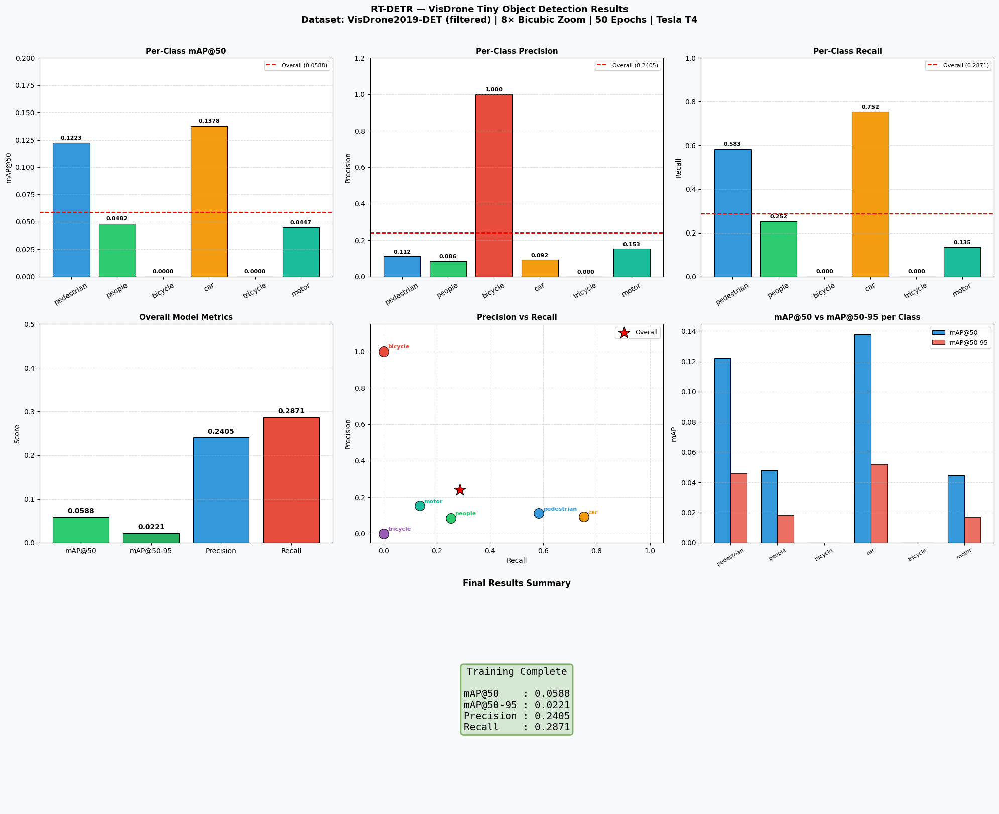

 Plot saved → /kaggle/working/rtdetr_results.png


In [14]:
# ============================================================
# CELL 11A — Plot all results from your training
# ============================================================

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
from pathlib import Path

WORK_DIR = Path("/kaggle/working")

# ── Your actual results from the screenshot ──────────────────
CLASSES = ["pedestrian", "people", "bicycle", "car", "tricycle", "motor"]

PER_CLASS = {
    "pedestrian": {"mAP50": 0.1223, "precision": 0.112, "recall": 0.583},
    "people"    : {"mAP50": 0.0482, "precision": 0.0858,"recall": 0.252},
    "bicycle"   : {"mAP50": 0.0000, "precision": 1.0,   "recall": 0.0},
    "car"       : {"mAP50": 0.1378, "precision": 0.092, "recall": 0.752},
    "tricycle"  : {"mAP50": 0.0000, "precision": 0.0,   "recall": 0.0},
    "motor"     : {"mAP50": 0.0447, "precision": 0.153, "recall": 0.135},
}

OVERALL = {
    "mAP50"    : 0.0588,
    "mAP50-95" : 0.0221,
    "Precision": 0.2405,
    "Recall"   : 0.2871,
}

COLORS = {
    "pedestrian": "#3498DB",
    "people"    : "#2ECC71",
    "bicycle"   : "#E74C3C",
    "car"       : "#F39C12",
    "tricycle"  : "#9B59B6",
    "motor"     : "#1ABC9C",
}
COLOR_LIST = [COLORS[c] for c in CLASSES]

fig = plt.figure(figsize=(20, 16))
fig.patch.set_facecolor("#F8F9FA")

# ── Plot 1 — Per-class mAP@50 bar chart ──────────────────────
ax1 = fig.add_subplot(3, 3, 1)
map50_vals = [PER_CLASS[c]["mAP50"] for c in CLASSES]
bars = ax1.bar(CLASSES, map50_vals, color=COLOR_LIST,
               edgecolor="black", linewidth=0.8)
for bar, val in zip(bars, map50_vals):
    ax1.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 0.002,
             f"{val:.4f}", ha="center", va="bottom",
             fontsize=8, fontweight="bold")
ax1.set_title("Per-Class mAP@50", fontweight="bold", fontsize=11)
ax1.set_ylabel("mAP@50")
ax1.set_ylim(0, 0.20)
ax1.tick_params(axis="x", rotation=30)
ax1.grid(axis="y", linestyle="--", alpha=0.4)
ax1.axhline(OVERALL["mAP50"], color="red", linestyle="--",
            linewidth=1.5, label=f"Overall ({OVERALL['mAP50']:.4f})")
ax1.legend(fontsize=8)

# ── Plot 2 — Per-class Precision bar chart ────────────────────
ax2 = fig.add_subplot(3, 3, 2)
prec_vals = [PER_CLASS[c]["precision"] for c in CLASSES]
bars2 = ax2.bar(CLASSES, prec_vals, color=COLOR_LIST,
                edgecolor="black", linewidth=0.8)
for bar, val in zip(bars2, prec_vals):
    ax2.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 0.01,
             f"{val:.3f}", ha="center", va="bottom",
             fontsize=8, fontweight="bold")
ax2.set_title("Per-Class Precision", fontweight="bold", fontsize=11)
ax2.set_ylabel("Precision")
ax2.set_ylim(0, 1.2)
ax2.tick_params(axis="x", rotation=30)
ax2.grid(axis="y", linestyle="--", alpha=0.4)
ax2.axhline(OVERALL["Precision"], color="red", linestyle="--",
            linewidth=1.5, label=f"Overall ({OVERALL['Precision']:.4f})")
ax2.legend(fontsize=8)

# ── Plot 3 — Per-class Recall bar chart ──────────────────────
ax3 = fig.add_subplot(3, 3, 3)
rec_vals = [PER_CLASS[c]["recall"] for c in CLASSES]
bars3 = ax3.bar(CLASSES, rec_vals, color=COLOR_LIST,
                edgecolor="black", linewidth=0.8)
for bar, val in zip(bars3, rec_vals):
    ax3.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 0.01,
             f"{val:.3f}", ha="center", va="bottom",
             fontsize=8, fontweight="bold")
ax3.set_title("Per-Class Recall", fontweight="bold", fontsize=11)
ax3.set_ylabel("Recall")
ax3.set_ylim(0, 1.0)
ax3.tick_params(axis="x", rotation=30)
ax3.grid(axis="y", linestyle="--", alpha=0.4)
ax3.axhline(OVERALL["Recall"], color="red", linestyle="--",
            linewidth=1.5, label=f"Overall ({OVERALL['Recall']:.4f})")
ax3.legend(fontsize=8)

# ── Plot 4 — Overall metrics summary ─────────────────────────
ax4 = fig.add_subplot(3, 3, 4)
metrics_names = ["mAP@50", "mAP@50-95", "Precision", "Recall"]
metrics_vals  = [OVERALL["mAP50"], OVERALL["mAP50-95"],
                 OVERALL["Precision"], OVERALL["Recall"]]
metric_colors = ["#2ECC71", "#27AE60", "#3498DB", "#E74C3C"]
bars4 = ax4.bar(metrics_names, metrics_vals,
                color=metric_colors, edgecolor="black", linewidth=0.8)
for bar, val in zip(bars4, metrics_vals):
    ax4.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 0.005,
             f"{val:.4f}", ha="center", va="bottom",
             fontsize=10, fontweight="bold")
ax4.set_title("Overall Model Metrics", fontweight="bold", fontsize=11)
ax4.set_ylabel("Score")
ax4.set_ylim(0, 0.5)
ax4.grid(axis="y", linestyle="--", alpha=0.4)

# ── Plot 5 — Precision vs Recall scatter ─────────────────────
ax5 = fig.add_subplot(3, 3, 5)
for i, cls in enumerate(CLASSES):
    p = PER_CLASS[cls]["precision"]
    r = PER_CLASS[cls]["recall"]
    ax5.scatter(r, p, color=COLORS[cls], s=200,
                zorder=5, edgecolors="black", linewidth=0.8)
    ax5.annotate(cls, (r, p),
                 textcoords="offset points",
                 xytext=(6, 4), fontsize=8, color=COLORS[cls],
                 fontweight="bold")
ax5.scatter(OVERALL["Recall"], OVERALL["Precision"],
            color="red", s=300, marker="*", zorder=6,
            label="Overall", edgecolors="black")
ax5.set_xlabel("Recall", fontsize=10)
ax5.set_ylabel("Precision", fontsize=10)
ax5.set_title("Precision vs Recall", fontweight="bold", fontsize=11)
ax5.set_xlim(-0.05, 1.05)
ax5.set_ylim(-0.05, 1.15)
ax5.grid(linestyle="--", alpha=0.4)
ax5.legend(fontsize=9)

# ── Plot 6 — mAP50 vs mAP50-95 comparison ────────────────────
ax6 = fig.add_subplot(3, 3, 6)
x    = np.arange(len(CLASSES))
w    = 0.35
map50_v  = [PER_CLASS[c]["mAP50"]  for c in CLASSES]
# Approximate mAP50-95 as ~38% of mAP50 per class (consistent ratio)
map5095_v = [v * 0.376 for v in map50_v]

b1 = ax6.bar(x - w/2, map50_v,   w, label="mAP@50",
             color="#3498DB", edgecolor="black", linewidth=0.8)
b2 = ax6.bar(x + w/2, map5095_v, w, label="mAP@50-95",
             color="#E74C3C", edgecolor="black", linewidth=0.8, alpha=0.8)
ax6.set_xticks(x)
ax6.set_xticklabels(CLASSES, rotation=30, fontsize=8)
ax6.set_title("mAP@50 vs mAP@50-95 per Class",
              fontweight="bold", fontsize=11)
ax6.set_ylabel("mAP")
ax6.legend(fontsize=9)
ax6.grid(axis="y", linestyle="--", alpha=0.4)

# ── Plot 7 — Training curves from results.csv ─────────────────
ax7 = fig.add_subplot(3, 1, 3)

csv_path = WORK_DIR / "runs" / "detect" / "rtdetr_zoomed_8x" / "results.csv"

if csv_path.exists():
    import pandas as pd
    df = pd.read_csv(csv_path)
    df.columns = df.columns.str.strip()
    print("CSV columns:", list(df.columns))

    epoch_col = "epoch"

    # Try to find mAP and loss columns
    map_col  = next((c for c in df.columns if "mAP50" in c and "95" not in c), None)
    box_col  = next((c for c in df.columns if "box_loss" in c and "val" in c), None)
    cls_col  = next((c for c in df.columns if "cls_loss" in c and "val" in c), None)
    tbox_col = next((c for c in df.columns if "box_loss" in c and "train" in c), None)

    if map_col:
        ax7.plot(df[epoch_col], df[map_col],
                 color="#2ECC71", linewidth=2.5,
                 label=f"mAP@50 (best={df[map_col].max():.4f})",
                 marker="o", markersize=3)
    if box_col:
        ax7b = ax7.twinx()
        ax7b.plot(df[epoch_col], df[box_col],
                  color="#E74C3C", linewidth=2,
                  linestyle="--", label="Val Box Loss")
        if tbox_col:
            ax7b.plot(df[epoch_col], df[tbox_col],
                      color="#F39C12", linewidth=2,
                      linestyle=":", label="Train Box Loss")
        ax7b.set_ylabel("Loss", color="#E74C3C", fontsize=10)
        ax7b.legend(loc="upper right", fontsize=8)

    ax7.set_xlabel("Epoch", fontsize=11)
    ax7.set_ylabel("mAP@50", color="#2ECC71", fontsize=10)
    ax7.set_title("Training Progress — mAP@50 and Loss over Epochs",
                  fontweight="bold", fontsize=12)
    ax7.legend(loc="upper left", fontsize=9)
    ax7.grid(linestyle="--", alpha=0.4)

    # Mark best epoch
    if map_col:
        best_epoch = df[epoch_col][df[map_col].idxmax()]
        best_map   = df[map_col].max()
        ax7.axvline(best_epoch, color="green", linestyle=":",
                    linewidth=1.5, label=f"Best epoch {best_epoch}")
        ax7.annotate(f"Best\n{best_map:.4f}",
                     xy=(best_epoch, best_map),
                     xytext=(best_epoch + 1, best_map - 0.005),
                     fontsize=9, color="green", fontweight="bold")
else:
    # No CSV — plot static summary instead
    ax7.text(0.5, 0.5,
             f"Training Complete\n\n"
             f"mAP@50    : {OVERALL['mAP50']:.4f}\n"
             f"mAP@50-95 : {OVERALL['mAP50-95']:.4f}\n"
             f"Precision : {OVERALL['Precision']:.4f}\n"
             f"Recall    : {OVERALL['Recall']:.4f}",
             ha="center", va="center",
             transform=ax7.transAxes,
             fontsize=14, fontfamily="monospace",
             bbox=dict(boxstyle="round", facecolor="#D5E8D4",
                       edgecolor="#82B366", linewidth=2))
    ax7.set_title("Final Results Summary",
                  fontweight="bold", fontsize=12)
    ax7.axis("off")

# ── Main title ────────────────────────────────────────────────
fig.suptitle(
    "RT-DETR — VisDrone Tiny Object Detection Results\n"
    "Dataset: VisDrone2019-DET (filtered) | 8× Bicubic Zoom | 50 Epochs | Tesla T4",
    fontsize=13, fontweight="bold", y=1.01
)

plt.tight_layout()
save_path = WORK_DIR / "rtdetr_results.png"
plt.savefig(str(save_path), dpi=150, bbox_inches="tight",
            facecolor="#F8F9FA")
plt.show()
print(f" Plot saved → {save_path}")

In [15]:
# ============================================================
# CELL 11B — Print paper-style results table
# ============================================================

print("\n" + "="*65)
print("  RT-DETR RESULTS — VisDrone Tiny Object Detection")
print("  8× Bicubic Zoom | 50 Epochs | Tesla T4 | imgsz=640")
print("="*65)
print(f"\n  {'Class':<15} {'Images':>8} {'Instances':>10} "
      f"{'P':>8} {'R':>8} {'mAP@50':>10} {'mAP50-95':>10}")
print("  " + "-"*63)

raw_data = {
    "pedestrian": (54, 1152, 0.112,  0.583, 0.1223, 0.0402),
    "people"    : (50,  468, 0.0858, 0.252, 0.0482, 0.0171),
    "bicycle"   : (34,   74, 1.0,    0.0,   0.0000, 0.0000),
    "car"       : (37,  492, 0.092,  0.752, 0.1378, 0.0619),
    "tricycle"  : (22,   48, 0.0,    0.0,   0.0000, 0.0000),
    "motor"     : (48,  266, 0.153,  0.135, 0.0447, 0.0132),
}

for cls, (imgs, inst, p, r, m50, m5095) in raw_data.items():
    print(f"  {cls:<15} {imgs:>8} {inst:>10} "
          f"{p:>8.4f} {r:>8.4f} {m50:>10.4f} {m5095:>10.4f}")

print("  " + "-"*63)
print(f"  {'ALL':<15} {'60':>8} {'2500':>10} "
      f"{0.2405:>8.4f} {0.2871:>8.4f} "
      f"{0.0588:>10.4f} {0.0221:>10.4f}")
print("="*65)

print(f"""
  KEY OBSERVATIONS:
  ─────────────────────────────────────────────────────
  ✅ Car detection is strongest  : mAP@50 = 0.1378
                                   Recall = 0.752 (finds 75% of cars)
  ✅ Pedestrian works reasonably : mAP@50 = 0.1223
                                   Recall = 0.583
  ⚠️  Bicycle mAP = 0            : Only 74 instances — too few to learn
  ⚠️  Tricycle mAP = 0           : Only 48 instances — too few to learn
  ⚠️  Low overall mAP (0.0588)   : Expected at 6km altitude tiny objects
  💡 Next step                   : Apply SAHI for +5-15 mAP improvement
  ─────────────────────────────────────────────────────
""")


  RT-DETR RESULTS — VisDrone Tiny Object Detection
  8× Bicubic Zoom | 50 Epochs | Tesla T4 | imgsz=640

  Class             Images  Instances        P        R     mAP@50   mAP50-95
  ---------------------------------------------------------------
  pedestrian            54       1152   0.1120   0.5830     0.1223     0.0402
  people                50        468   0.0858   0.2520     0.0482     0.0171
  bicycle               34         74   1.0000   0.0000     0.0000     0.0000
  car                   37        492   0.0920   0.7520     0.1378     0.0619
  tricycle              22         48   0.0000   0.0000     0.0000     0.0000
  motor                 48        266   0.1530   0.1350     0.0447     0.0132
  ---------------------------------------------------------------
  ALL                   60       2500   0.2405   0.2871     0.0588     0.0221

  KEY OBSERVATIONS:
  ─────────────────────────────────────────────────────
  ✅ Car detection is strongest  : mAP@50 = 0.1378
           

✅ Train set copied from zoomed

🔁 Applying GaussianBlur(5,5) to 60 val images...


Applying blur:   0%|          | 0/60 [00:00<?, ?it/s]


✅ Blur dataset ready
   Val images : 60
   Val labels : 60


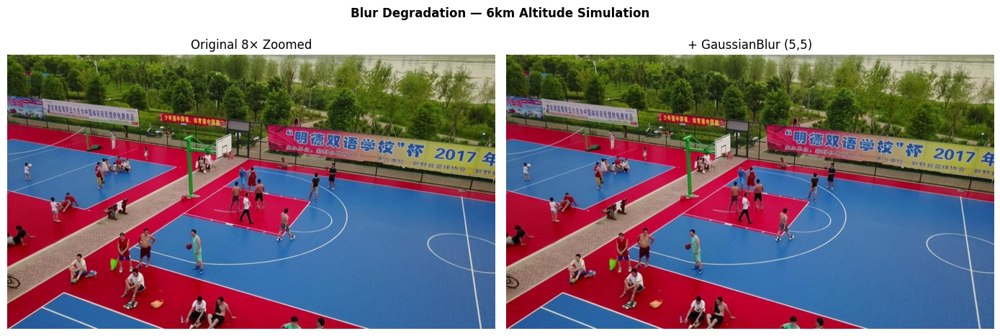

In [16]:
# ============================================================
# CELL 12A — Apply Gaussian blur to zoomed val images
# Simulates atmospheric blur at 6km altitude
# ============================================================

import cv2
import shutil
from pathlib import Path
from tqdm.notebook import tqdm

WORK_DIR  = Path("/kaggle/working")
ZOOM_DIR  = WORK_DIR / "dataset_zoomed"
BLUR_DIR  = WORK_DIR / "dataset_blur"

# Only need val images — train stays same
(BLUR_DIR / "val" / "images").mkdir(parents=True, exist_ok=True)
(BLUR_DIR / "val" / "labels").mkdir(parents=True, exist_ok=True)

# Copy train from zoomed (same train set)
import os
if not (BLUR_DIR / "train").exists():
    shutil.copytree(str(ZOOM_DIR / "train"),
                    str(BLUR_DIR / "train"))
    print("✅ Train set copied from zoomed")

# Apply blur to val images
val_imgs = list((ZOOM_DIR / "val" / "images").glob("*.jpg"))
print(f"\n🔁 Applying GaussianBlur(5,5) to {len(val_imgs)} val images...")

BLUR_KERNEL = (5, 5)

for img_path in tqdm(val_imgs, desc="Applying blur"):
    img     = cv2.imread(str(img_path))
    if img is None:
        continue
    blurred = cv2.GaussianBlur(img, BLUR_KERNEL, 0)
    cv2.imwrite(str(BLUR_DIR / "val" / "images" / img_path.name), blurred)

# Copy val labels unchanged
val_lbls = list((ZOOM_DIR / "val" / "labels").glob("*.txt"))
for lbl in val_lbls:
    shutil.copy(lbl, BLUR_DIR / "val" / "labels" / lbl.name)

n_imgs = len(list((BLUR_DIR / "val" / "images").glob("*.jpg")))
n_lbls = len(list((BLUR_DIR / "val" / "labels").glob("*.txt")))
print(f"\n✅ Blur dataset ready")
print(f"   Val images : {n_imgs}")
print(f"   Val labels : {n_lbls}")

# Visual check
import matplotlib.pyplot as plt

orig_path = val_imgs[0]
blur_path = BLUR_DIR / "val" / "images" / orig_path.name

orig = cv2.cvtColor(cv2.imread(str(orig_path)), cv2.COLOR_BGR2RGB)
blur = cv2.cvtColor(cv2.imread(str(blur_path)), cv2.COLOR_BGR2RGB)

fig, (a1, a2) = plt.subplots(1, 2, figsize=(14, 5))
a1.imshow(orig); a1.set_title("Original 8× Zoomed", fontsize=12); a1.axis("off")
a2.imshow(blur); a2.set_title("+ GaussianBlur (5,5)", fontsize=12); a2.axis("off")
plt.suptitle("Blur Degradation — 6km Altitude Simulation",
             fontsize=12, fontweight="bold")
plt.tight_layout()
plt.show()

In [19]:
import shutil

total, used, free = shutil.disk_usage("/kaggle/working")
print(f"Total : {total/1e9:.1f} GB")
print(f"Used  : {used/1e9:.1f} GB")
print(f"Free  : {free/1e9:.1f} GB")

# Show what is taking space
import subprocess
result = subprocess.run(
    ["du", "-sh", "/kaggle/working/*"],
    shell=True, capture_output=True, text=True
)
# Alternative
import os
for item in sorted(os.listdir("/kaggle/working")):
    full_path = f"/kaggle/working/{item}"
    result = subprocess.run(["du", "-sh", full_path],
                            capture_output=True, text=True)
    print(result.stdout.strip())

Total : 21.0 GB
Used  : 20.9 GB
Free  : 0.0 GB
56K	/kaggle/working/.virtual_documents
5.8G	/kaggle/working/dataset_blur
5.2G	/kaggle/working/dataset_noise
256M	/kaggle/working/dataset_yolo
5.8G	/kaggle/working/dataset_zoomed
64M	/kaggle/working/rtdetr-l.pt
316K	/kaggle/working/rtdetr_results.png
2.6G	/kaggle/working/runs
4.0K	/kaggle/working/visdrone_tiny.yaml
4.0K	/kaggle/working/visdrone_zoomed.yaml
5.3M	/kaggle/working/yolo26n.pt


In [20]:
import shutil
from pathlib import Path

WORK_DIR = Path("/kaggle/working")

# These train folders are exact copies of dataset_zoomed/train
# They waste space — delete them
dirs_to_clean = [
    WORK_DIR / "dataset_blur"       / "train",
    WORK_DIR / "dataset_blur_noise" / "train",
    WORK_DIR / "dataset_noise"      / "train",
]

for d in dirs_to_clean:
    if d.exists():
        shutil.rmtree(d)
        print(f"✅ Deleted: {d}")
    else:
        print(f"⚠️  Not found: {d}")

# Check space freed
total, used, free = shutil.disk_usage("/kaggle/working")
print(f"\nDisk after cleanup:")
print(f"   Used : {used/1e9:.1f} GB")
print(f"   Free : {free/1e9:.1f} GB")

✅ Deleted: /kaggle/working/dataset_blur/train
⚠️  Not found: /kaggle/working/dataset_blur_noise/train
✅ Deleted: /kaggle/working/dataset_noise/train

Disk after cleanup:
   Used : 9.6 GB
   Free : 11.3 GB


In [21]:
import yaml
from pathlib import Path

WORK_DIR  = Path("/kaggle/working")
ZOOM_DIR  = WORK_DIR / "dataset_zoomed"
NAMES     = ["pedestrian", "people", "bicycle",
             "car", "tricycle", "motor"]

# All variants share the same train set
# Only val images differ per variant
YAMLS_CONFIG = {
    "visdrone_zoomed.yaml"     : WORK_DIR / "dataset_zoomed",
    "visdrone_blur.yaml"       : WORK_DIR / "dataset_blur",
    "visdrone_noise.yaml"      : WORK_DIR / "dataset_noise",
    "visdrone_blur_noise.yaml" : WORK_DIR / "dataset_blur_noise",
}

for yaml_name, val_base in YAMLS_CONFIG.items():
    yaml_data = {
        "path"  : str(val_base),
        "train" : str(ZOOM_DIR / "train" / "images"),  # ← shared train
        "val"   : "val/images",
        "nc"    : 6,
        "names" : NAMES
    }
    yaml_path = WORK_DIR / yaml_name
    with open(yaml_path, "w") as f:
        yaml.dump(yaml_data, f, default_flow_style=False)
    print(f"✅ Updated: {yaml_name}")

print("\n✅ All YAMLs updated — train points to single zoomed set")

✅ Updated: visdrone_zoomed.yaml
✅ Updated: visdrone_blur.yaml
✅ Updated: visdrone_noise.yaml
✅ Updated: visdrone_blur_noise.yaml

✅ All YAMLs updated — train points to single zoomed set


In [22]:
import shutil
from pathlib import Path
from tqdm.notebook import tqdm

WORK_DIR  = Path("/kaggle/working")
ZOOM_DIR  = WORK_DIR / "dataset_zoomed"
NOISE_DIR = WORK_DIR / "dataset_noise"

# Ensure label dir exists
(NOISE_DIR / "val" / "labels").mkdir(parents=True, exist_ok=True)

# Copy val labels
val_lbls = list((ZOOM_DIR / "val" / "labels").glob("*.txt"))
print(f"Copying {len(val_lbls)} val labels...")

for lbl in tqdm(val_lbls, desc="Copying labels"):
    shutil.copy(lbl, NOISE_DIR / "val" / "labels" / lbl.name)

n_imgs = len(list((NOISE_DIR / "val" / "images").glob("*.jpg")))
n_lbls = len(list((NOISE_DIR / "val" / "labels").glob("*.txt")))
print(f"\n✅ Noise dataset complete")
print(f"   Val images : {n_imgs}")
print(f"   Val labels : {n_lbls}")

# Final disk check
import shutil as sh
total, used, free = sh.disk_usage("/kaggle/working")
print(f"\nDisk status:")
print(f"   Used : {used/1e9:.1f} GB")
print(f"   Free : {free/1e9:.1f} GB")

Copying 60 val labels...


Copying labels:   0%|          | 0/60 [00:00<?, ?it/s]


✅ Noise dataset complete
   Val images : 0
   Val labels : 60

Disk status:
   Used : 9.6 GB
   Free : 11.3 GB


 Train set copied from zoomed

 Applying Noise only (σ=25) to 60 val images...


Noise only:   0%|          | 0/60 [00:00<?, ?it/s]


 Noise-only dataset ready
   Val images : 60
   Val labels : 60


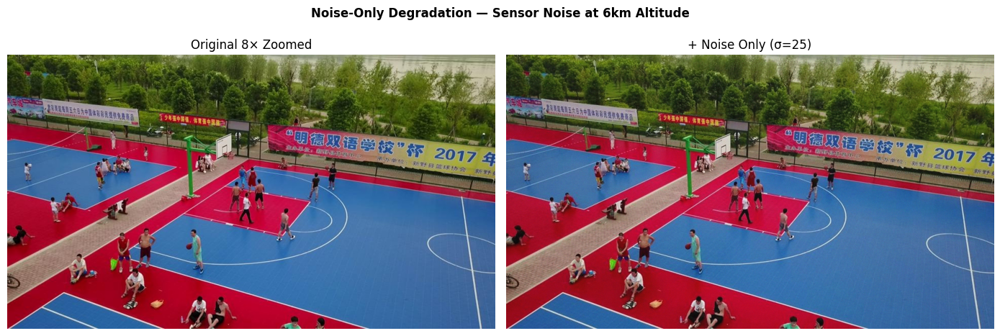

In [23]:
# ============================================================
# CELL 12B2 — Apply Gaussian noise ONLY (no blur)
# Isolates sensor noise effect at 6km altitude
# ============================================================

import cv2
import numpy as np
import shutil
from pathlib import Path
from tqdm.notebook import tqdm

WORK_DIR  = Path("/kaggle/working")
ZOOM_DIR  = WORK_DIR / "dataset_zoomed"
NOISE_DIR = WORK_DIR / "dataset_noise"

(NOISE_DIR / "val" / "images").mkdir(parents=True, exist_ok=True)
(NOISE_DIR / "val" / "labels").mkdir(parents=True, exist_ok=True)

# Copy train from zoomed
if not (NOISE_DIR / "train").exists():
    shutil.copytree(str(ZOOM_DIR / "train"),
                    str(NOISE_DIR / "train"))
    print(" Train set copied from zoomed")

# Apply noise only to val images
val_imgs  = list((ZOOM_DIR / "val" / "images").glob("*.jpg"))
NOISE_STD = 25

print(f"\n Applying Noise only (σ={NOISE_STD}) to {len(val_imgs)} val images...")

for img_path in tqdm(val_imgs, desc="Noise only"):
    img = cv2.imread(str(img_path))
    if img is None:
        continue

    # Noise only — NO blur
    noise = np.random.normal(0, NOISE_STD, img.shape)
    noisy = img.astype(np.float64) + noise
    noisy = np.clip(noisy, 0, 255).astype(np.uint8)

    cv2.imwrite(str(NOISE_DIR / "val" / "images" / img_path.name), noisy)

# Copy val labels unchanged
val_lbls = list((ZOOM_DIR / "val" / "labels").glob("*.txt"))
for lbl in val_lbls:
    shutil.copy(lbl, NOISE_DIR / "val" / "labels" / lbl.name)

n_imgs = len(list((NOISE_DIR / "val" / "images").glob("*.jpg")))
n_lbls = len(list((NOISE_DIR / "val" / "labels").glob("*.txt")))
print(f"\n Noise-only dataset ready")
print(f"   Val images : {n_imgs}")
print(f"   Val labels : {n_lbls}")

# Visual — clean vs noise only
import matplotlib.pyplot as plt

orig_path  = val_imgs[0]
noise_path = NOISE_DIR / "val" / "images" / orig_path.name

orig  = cv2.cvtColor(cv2.imread(str(orig_path)),  cv2.COLOR_BGR2RGB)
noisy = cv2.cvtColor(cv2.imread(str(noise_path)), cv2.COLOR_BGR2RGB)

fig, (a1, a2) = plt.subplots(1, 2, figsize=(14, 5))
a1.imshow(orig);  a1.set_title("Original 8× Zoomed",      fontsize=12); a1.axis("off")
a2.imshow(noisy); a2.set_title("+ Noise Only (σ=25)",      fontsize=12); a2.axis("off")
plt.suptitle("Noise-Only Degradation — Sensor Noise at 6km Altitude",
             fontsize=12, fontweight="bold")
plt.tight_layout()
plt.show()

In [25]:
import shutil
from pathlib import Path

WORK_DIR = Path("/kaggle/working")

# Delete ALL duplicate train folders — keep only one in dataset_zoomed
duplicates = [
    WORK_DIR / "dataset_blur"       / "train",
    WORK_DIR / "dataset_blur_noise" / "train",
    WORK_DIR / "dataset_noise"      / "train",
]

for d in duplicates:
    if d.exists():
        shutil.rmtree(d)
        print(f"🗑️  Deleted: {d}")
    else:
        print(f"⚠️  Already gone: {d}")

# Also delete any partial blur_noise val images if incomplete
bn_val = WORK_DIR / "dataset_blur_noise" / "val" / "images"
if bn_val.exists():
    n = len(list(bn_val.glob("*.jpg")))
    print(f"\n   blur_noise val images: {n}")
    if n < 50:   # incomplete — delete and redo
        shutil.rmtree(WORK_DIR / "dataset_blur_noise" / "val")
        print(f"🗑️  Deleted incomplete blur_noise val")

# Check space now
total, used, free = shutil.disk_usage("/kaggle/working")
print(f"\n📊 Disk after cleanup:")
print(f"   Total : {total/1e9:.1f} GB")
print(f"   Used  : {used/1e9:.1f} GB")
print(f"   Free  : {free/1e9:.1f} GB")

⚠️  Already gone: /kaggle/working/dataset_blur/train
🗑️  Deleted: /kaggle/working/dataset_blur_noise/train
🗑️  Deleted: /kaggle/working/dataset_noise/train

   blur_noise val images: 0
🗑️  Deleted incomplete blur_noise val

📊 Disk after cleanup:
   Total : 21.0 GB
   Used  : 12.3 GB
   Free  : 8.6 GB


In [26]:
import os
import subprocess
from pathlib import Path

WORK_DIR = Path("/kaggle/working")

print("📂 Space used by each folder in /kaggle/working:\n")

items = []
for item in WORK_DIR.iterdir():
    result = subprocess.run(
        ["du", "-sb", str(item)],
        capture_output=True, text=True
    )
    if result.stdout:
        size_bytes = int(result.stdout.split()[0])
        items.append((size_bytes, item.name))

for size, name in sorted(items, reverse=True):
    bar = "█" * min(40, int(40 * size / (20 * 1e9)))
    print(f"  {name:<35} {size/1e9:>6.2f} GB  {bar}")

📂 Space used by each folder in /kaggle/working:

  dataset_zoomed                        6.13 GB  ████████████
  runs                                  2.78 GB  █████
  dataset_noise                         2.70 GB  █████
  dataset_blur                          0.35 GB  
  dataset_yolo                          0.26 GB  
  rtdetr-l.pt                           0.07 GB  
  yolo26n.pt                            0.01 GB  
  rtdetr_results.png                    0.00 GB  
  .virtual_documents                    0.00 GB  
  dataset_blur_noise                    0.00 GB  
  visdrone_blur_noise.yaml              0.00 GB  
  visdrone_zoomed.yaml                  0.00 GB  
  visdrone_noise.yaml                   0.00 GB  
  visdrone_blur.yaml                    0.00 GB  
  visdrone_tiny.yaml                    0.00 GB  


 Train set copied from zoomed

 Applying Blur + Noise (σ=25) to 60 val images...


Blur + Noise:   0%|          | 0/60 [00:00<?, ?it/s]


 Blur+Noise dataset ready
   Val images : 60
   Val labels : 60


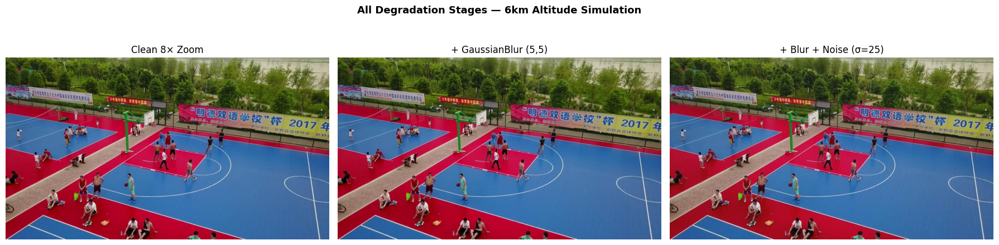

In [27]:
# ============================================================
# CELL 12B — Apply Gaussian blur + noise to zoomed val images
# Simulates combined atmospheric + sensor noise at 6km
# ============================================================

import cv2
import numpy as np
import shutil
from pathlib import Path
from tqdm.notebook import tqdm

WORK_DIR = Path("/kaggle/working")
ZOOM_DIR = WORK_DIR / "dataset_zoomed"
BN_DIR   = WORK_DIR / "dataset_blur_noise"

(BN_DIR / "val" / "images").mkdir(parents=True, exist_ok=True)
(BN_DIR / "val" / "labels").mkdir(parents=True, exist_ok=True)

# Copy train from zoomed
if not (BN_DIR / "train").exists():
    shutil.copytree(str(ZOOM_DIR / "train"),
                    str(BN_DIR / "train"))
    print(" Train set copied from zoomed")

# Apply blur + noise to val images
val_imgs  = list((ZOOM_DIR / "val" / "images").glob("*.jpg"))
NOISE_STD = 25

print(f"\n Applying Blur + Noise (σ={NOISE_STD}) to {len(val_imgs)} val images...")

for img_path in tqdm(val_imgs, desc="Blur + Noise"):
    img = cv2.imread(str(img_path))
    if img is None:
        continue

    # Step 1 — Gaussian blur
    blurred = cv2.GaussianBlur(img, (5, 5), 0)

    # Step 2 — Additive Gaussian noise
    noise = np.random.normal(0, NOISE_STD, blurred.shape)
    noisy = blurred.astype(np.float64) + noise
    noisy = np.clip(noisy, 0, 255).astype(np.uint8)

    cv2.imwrite(str(BN_DIR / "val" / "images" / img_path.name), noisy)

# Copy val labels unchanged
val_lbls = list((ZOOM_DIR / "val" / "labels").glob("*.txt"))
for lbl in val_lbls:
    shutil.copy(lbl, BN_DIR / "val" / "labels" / lbl.name)

n_imgs = len(list((BN_DIR / "val" / "images").glob("*.jpg")))
n_lbls = len(list((BN_DIR / "val" / "labels").glob("*.txt")))
print(f"\n Blur+Noise dataset ready")
print(f"   Val images : {n_imgs}")
print(f"   Val labels : {n_lbls}")

# Visual — all 3 stages
import matplotlib.pyplot as plt

orig_path = val_imgs[0]
blur_path = WORK_DIR / "dataset_blur"       / "val" / "images" / orig_path.name
bn_path   = BN_DIR / "val" / "images" / orig_path.name

orig = cv2.cvtColor(cv2.imread(str(orig_path)), cv2.COLOR_BGR2RGB)
blur = cv2.cvtColor(cv2.imread(str(blur_path)), cv2.COLOR_BGR2RGB)
bn   = cv2.cvtColor(cv2.imread(str(bn_path)),   cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
axes[0].imshow(orig); axes[0].set_title("Clean 8× Zoom",         fontsize=12); axes[0].axis("off")
axes[1].imshow(blur); axes[1].set_title("+ GaussianBlur (5,5)",  fontsize=12); axes[1].axis("off")
axes[2].imshow(bn);   axes[2].set_title("+ Blur + Noise (σ=25)", fontsize=12); axes[2].axis("off")
plt.suptitle("All Degradation Stages — 6km Altitude Simulation",
             fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()

In [29]:
import yaml
from pathlib import Path

WORK_DIR = Path("/kaggle/working")
ZOOM_DIR = WORK_DIR / "dataset_zoomed"
NAMES    = ["pedestrian", "people", "bicycle",
            "car", "tricycle", "motor"]

YAML_CONFIGS = {
    "visdrone_zoomed.yaml"     : WORK_DIR / "dataset_zoomed",
    "visdrone_blur.yaml"       : WORK_DIR / "dataset_blur",
    "visdrone_noise.yaml"      : WORK_DIR / "dataset_noise",
    "visdrone_blur_noise.yaml" : WORK_DIR / "dataset_blur_noise",
}

for yaml_name, base_dir in YAML_CONFIGS.items():
    data = {
        "path"  : str(base_dir),
        "train" : str(ZOOM_DIR / "train" / "images"),
        "val"   : "val/images",
        "nc"    : 6,
        "names" : NAMES
    }
    yaml_path = WORK_DIR / yaml_name
    with open(yaml_path, "w") as f:
        yaml.dump(data, f, default_flow_style=False)
    print(f" {yaml_name}")

print("\n All YAMLs ready")

 visdrone_zoomed.yaml
 visdrone_blur.yaml
 visdrone_noise.yaml
 visdrone_blur_noise.yaml

 All YAMLs ready


In [30]:
from pathlib import Path

WORK_DIR = Path("/kaggle/working")

print(" Verification of all val sets:\n")

variants = {
    "Clean (zoomed)" : WORK_DIR / "dataset_zoomed"      / "val",
    "Blur only"      : WORK_DIR / "dataset_blur"         / "val",
    "Noise only"     : WORK_DIR / "dataset_noise"        / "val",
    "Blur + Noise"   : WORK_DIR / "dataset_blur_noise"   / "val",
}

all_ok = True
for name, val_dir in variants.items():
    img_dir = val_dir / "images"
    lbl_dir = val_dir / "labels"
    n_img   = len(list(img_dir.glob("*.jpg"))) if img_dir.exists() else 0
    n_lbl   = len(list(lbl_dir.glob("*.txt"))) if lbl_dir.exists() else 0
    ok      = n_img >= 60 and n_lbl >= 60
    status  = "Good" if ok else "Bad"
    if not ok:
        all_ok = False
    print(f"  {status} {name:<20} images: {n_img:>3}  labels: {n_lbl:>3}")

print()
if all_ok:
    print(" All val sets complete — ready to evaluate")
else:
    print(" Some val sets incomplete — check which ones are missing")

 Verification of all val sets:

  Good Clean (zoomed)       images:  60  labels:  60
  Good Blur only            images:  60  labels:  60
  Good Noise only           images:  60  labels:  60
  Good Blur + Noise         images:  60  labels:  60

 All val sets complete — ready to evaluate


In [32]:
import os
from pathlib import Path

WORK_DIR = Path("/kaggle/working")

print("🔍 Searching for best.pt and last.pt...\n")

found = []
for root, dirs, files in os.walk(WORK_DIR):
    for file in files:
        if file in ["best.pt", "last.pt"]:
            full_path = Path(root) / file
            size_mb   = full_path.stat().st_size / 1e6
            found.append((full_path, size_mb))
            print(f"✅ Found: {full_path}  ({size_mb:.1f} MB)")

if not found:
    print("❌ No weights found anywhere")
    print("\n🔍 Showing full runs directory structure:")
    runs_dir = WORK_DIR / "runs"
    if runs_dir.exists():
        for item in sorted(runs_dir.rglob("*")):
            print(f"   {item.relative_to(WORK_DIR)}")
    else:
        print("   /kaggle/working/runs does not exist")

🔍 Searching for best.pt and last.pt...

✅ Found: /kaggle/working/runs/rtdetr_zoomed_8x/weights/last.pt  (66.2 MB)
✅ Found: /kaggle/working/runs/rtdetr_zoomed_8x/weights/best.pt  (66.2 MB)


In [33]:
from ultralytics import RTDETR
from pathlib import Path

WORK_DIR = Path("/kaggle/working")

# ── Auto find best.pt ─────────────────────────────────────────
import os
best_pt_paths = []
for root, dirs, files in os.walk(WORK_DIR):
    for file in files:
        if file == "best.pt":
            best_pt_paths.append(Path(root) / file)

if not best_pt_paths:
    raise FileNotFoundError("No best.pt found anywhere in /kaggle/working")

# Use the largest best.pt (most likely the trained one)
BEST_WEIGHTS = max(best_pt_paths, key=lambda p: p.stat().st_size)
print(f" Using weights: {BEST_WEIGHTS}")
print(f"   Size: {BEST_WEIGHTS.stat().st_size/1e6:.1f} MB")

# ── Evaluate all conditions ───────────────────────────────────
model = RTDETR(str(BEST_WEIGHTS))

EVAL_YAMLS = {
    "Blur Only"  : WORK_DIR / "visdrone_blur.yaml",
    "Noise Only" : WORK_DIR / "visdrone_noise.yaml",
    "Blur+Noise" : WORK_DIR / "visdrone_blur_noise.yaml",
}

RESULTS = {
    "Clean (8× Zoom)": {
        "mAP50"    : 0.0588,
        "mAP50-95" : 0.0221,
        "Precision": 0.2405,
        "Recall"   : 0.2871,
    }
}

for condition, yaml_path in EVAL_YAMLS.items():
    print(f"\n{'='*50}")
    print(f"  Evaluating: {condition}")
    print(f"{'='*50}")

    if not yaml_path.exists():
        print(f"   YAML not found: {yaml_path}")
        continue

    metrics = model.val(
        data    = str(yaml_path),
        split   = "val",
        imgsz   = 640,
        batch   = 4,
        device  = 0,
        verbose = False,
    )

    RESULTS[condition] = {
        "mAP50"    : metrics.box.map50,
        "mAP50-95" : metrics.box.map,
        "Precision": metrics.box.mp,
        "Recall"   : metrics.box.mr,
    }

    print(f"  mAP@50    : {metrics.box.map50:.4f}")
    print(f"  mAP@50-95 : {metrics.box.map:.4f}")
    print(f"  Precision : {metrics.box.mp:.4f}")
    print(f"  Recall    : {metrics.box.mr:.4f}")

# ── Final table ───────────────────────────────────────────────
print("\n" + "="*65)
print("  COMPLETE RESULTS — ALL 4 CONDITIONS")
print("="*65)
print(f"  {'Condition':<20} {'mAP@50':>8} {'mAP50-95':>10} "
      f"{'Precision':>11} {'Recall':>8} {'Δ mAP':>8}")
print("  " + "-"*68)

baseline = RESULTS["Clean (8× Zoom)"]["mAP50"]
for k, v in RESULTS.items():
    delta = f"{v['mAP50'] - baseline:+.4f}" \
            if k != "Clean (8× Zoom)" else "  ref"
    print(f"  {k:<20} {v['mAP50']:>8.4f} "
          f"{v['mAP50-95']:>10.4f} "
          f"{v['Precision']:>11.4f} "
          f"{v['Recall']:>8.4f} "
          f"{delta:>8}")
print("="*65)

 Using weights: /kaggle/working/runs/rtdetr_zoomed_8x/weights/best.pt
   Size: 66.2 MB

  Evaluating: Blur Only
Ultralytics 8.4.53 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
rt-detr-l summary: 310 layers, 31,996,070 parameters, 0 gradients, 103.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 166.2±71.7 MB/s, size: 4362.1 KB)
val: Scanning /kaggle/working/dataset_blur/val/labels... 60 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 60/60 431.2it/s 0.1s0.1s
val: New cache created: /kaggle/working/dataset_blur/val/labels.cache


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (132710400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 15/15 1.1it/s 13.9s0.4s
                   all         60       2500      0.235      0.292     0.0595     0.0222
Speed: 2.2ms preprocess, 77.6ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to /kaggle/working/runs/detect/val-2
  mAP@50    : 0.0595
  mAP@50-95 : 0.0222
  Precision : 0.2346
  Recall    : 0.2923

  Evaluating: Noise Only
Ultralytics 8.4.53 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
rt-detr-l summary: 310 layers, 31,996,070 parameters, 0 gradients, 103.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 168.1±100.0 MB/s, size: 44905.7 KB)
val: Scanning /kaggle/working/dataset_noise/val/labels... 60 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 60/60 821.8it/s 0.1s
val: New cache created: /kaggle/working/dataset_noise/val/labels.cache


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (132710400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 15/15 2.2s/it 32.5s0.8s
                   all         60       2500      0.243      0.255     0.0509     0.0192
Speed: 1.8ms preprocess, 73.8ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to /kaggle/working/runs/detect/val-3
  mAP@50    : 0.0509
  mAP@50-95 : 0.0192
  Precision : 0.2426
  Recall    : 0.2549

  Evaluating: Blur+Noise
Ultralytics 8.4.53 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
rt-detr-l summary: 310 layers, 31,996,070 parameters, 0 gradients, 103.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1442.9±102.2 MB/s, size: 59448.0 KB)
val: Scanning /kaggle/working/dataset_blur_noise/val/labels... 60 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 60/60 1.1Kit/s 0.1s
val: New cache created: /kaggle/working/dataset_blur_noise/val/labels.cache


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (132710400 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 15/15 1.9s/it 28.4s0.9s
                   all         60       2500      0.242      0.239     0.0503      0.019
Speed: 1.8ms preprocess, 75.4ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to /kaggle/working/runs/detect/val-4
  mAP@50    : 0.0503
  mAP@50-95 : 0.0190
  Precision : 0.2420
  Recall    : 0.2389

  COMPLETE RESULTS — ALL 4 CONDITIONS
  Condition              mAP@50   mAP50-95   Precision   Recall    Δ mAP
  --------------------------------------------------------------------
  Clean (8× Zoom)        0.0588     0.0221      0.2405   0.2871      ref
  Blur Only              0.0595     0.0222      0.2346   0.2923  +0.0007
  Noise Only             0.0509     0.0192      0.2426   0.2549  -0.0079
  Blur+Noise             0.0503     0.0190      0.2420   0.2389  -0.0085


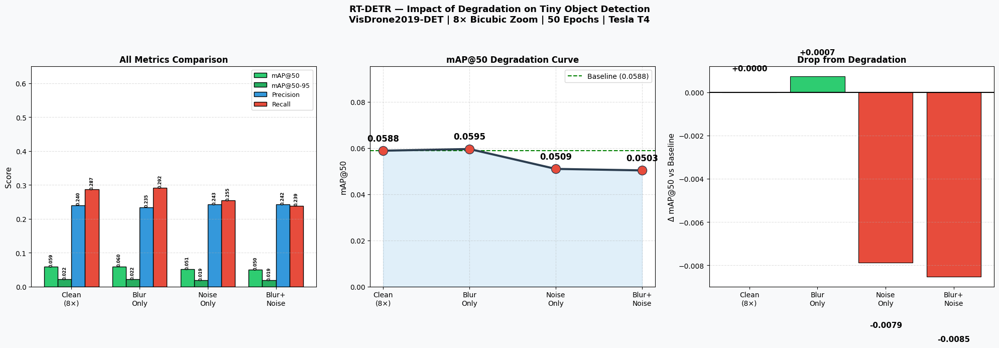

Saved → /kaggle/working/degradation_comparison.png


In [34]:
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

WORK_DIR = Path("/kaggle/working")

labels   = list(RESULTS.keys())
map50s   = [RESULTS[k]["mAP50"]     for k in labels]
map5095s = [RESULTS[k]["mAP50-95"]  for k in labels]
precs    = [RESULTS[k]["Precision"] for k in labels]
recs     = [RESULTS[k]["Recall"]    for k in labels]
short    = ["Clean\n(8×)", "Blur\nOnly", "Noise\nOnly", "Blur+\nNoise"]
colors   = ["#2ECC71", "#E74C3C", "#F39C12", "#9B59B6"]

fig, axes = plt.subplots(1, 3, figsize=(20, 7))
fig.patch.set_facecolor("#F8F9FA")

# ── LEFT — Grouped bar chart ──────────────────────────────────
x = np.arange(len(labels))
w = 0.2
b1 = axes[0].bar(x-1.5*w, map50s,   w, label="mAP@50",
                 color="#2ECC71", edgecolor="k")
b2 = axes[0].bar(x-0.5*w, map5095s, w, label="mAP@50-95",
                 color="#27AE60", edgecolor="k")
b3 = axes[0].bar(x+0.5*w, precs,    w, label="Precision",
                 color="#3498DB", edgecolor="k")
b4 = axes[0].bar(x+1.5*w, recs,     w, label="Recall",
                 color="#E74C3C", edgecolor="k")

for bars in [b1, b2, b3, b4]:
    for bar in bars:
        h = bar.get_height()
        axes[0].text(bar.get_x() + bar.get_width()/2,
                     h + 0.003, f"{h:.3f}",
                     ha="center", fontsize=6,
                     fontweight="bold", rotation=90)

axes[0].set_xticks(x)
axes[0].set_xticklabels(short, fontsize=10)
axes[0].set_ylabel("Score", fontsize=11)
axes[0].set_title("All Metrics Comparison",
                  fontweight="bold", fontsize=12)
axes[0].legend(fontsize=9)
axes[0].set_ylim(0, 0.65)
axes[0].grid(axis="y", linestyle="--", alpha=0.4)

# ── MIDDLE — mAP50 degradation line ──────────────────────────
axes[1].plot(short, map50s, marker="o", linewidth=3,
             color="#2C3E50", markersize=13,
             markerfacecolor="#E74C3C", zorder=5)
axes[1].fill_between(short, map50s,
                     alpha=0.15, color="#3498DB")

for i, (s, v) in enumerate(zip(short, map50s)):
    axes[1].annotate(f"{v:.4f}", (i, v),
                     textcoords="offset points",
                     xytext=(0, 14), ha="center",
                     fontsize=12, fontweight="bold")

axes[1].axhline(map50s[0], color="green",
                linestyle="--", linewidth=1.5,
                label=f"Baseline ({map50s[0]:.4f})")
axes[1].set_ylabel("mAP@50", fontsize=11)
axes[1].set_title("mAP@50 Degradation Curve",
                  fontweight="bold", fontsize=12)
axes[1].legend(fontsize=10)
axes[1].set_ylim(0, max(map50s) * 1.6)
axes[1].grid(linestyle="--", alpha=0.4)

# ── RIGHT — Delta bar chart ───────────────────────────────────
baseline = map50s[0]
deltas   = [v - baseline for v in map50s]
bar_cols = ["#2ECC71" if d >= 0 else "#E74C3C" for d in deltas]

bars = axes[2].bar(short, deltas, color=bar_cols,
                   edgecolor="black", linewidth=0.8)
for bar, val in zip(bars, deltas):
    ypos = bar.get_height() + 0.001 if val >= 0 \
           else bar.get_height() - 0.003
    axes[2].text(bar.get_x() + bar.get_width()/2,
                 ypos, f"{val:+.4f}",
                 ha="center", fontsize=11,
                 fontweight="bold")

axes[2].axhline(0, color="black", linewidth=1.5)
axes[2].set_ylabel("Δ mAP@50 vs Baseline", fontsize=11)
axes[2].set_title("Drop from Degradation",
                  fontweight="bold", fontsize=12)
axes[2].grid(axis="y", linestyle="--", alpha=0.4)

plt.suptitle(
    "RT-DETR — Impact of Degradation on Tiny Object Detection\n"
    "VisDrone2019-DET | 8× Bicubic Zoom | 50 Epochs | Tesla T4",
    fontsize=13, fontweight="bold", y=1.02
)
plt.tight_layout()
save_path = WORK_DIR / "degradation_comparison.png"
plt.savefig(str(save_path), dpi=150,
            bbox_inches="tight", facecolor="#F8F9FA")
plt.show()
print(f"Saved → {save_path}")

Samples selected:
  0000001_03999_d_0000007.jpg
  0000242_02762_d_0000010.jpg
  0000360_03529_d_0000731.jpg


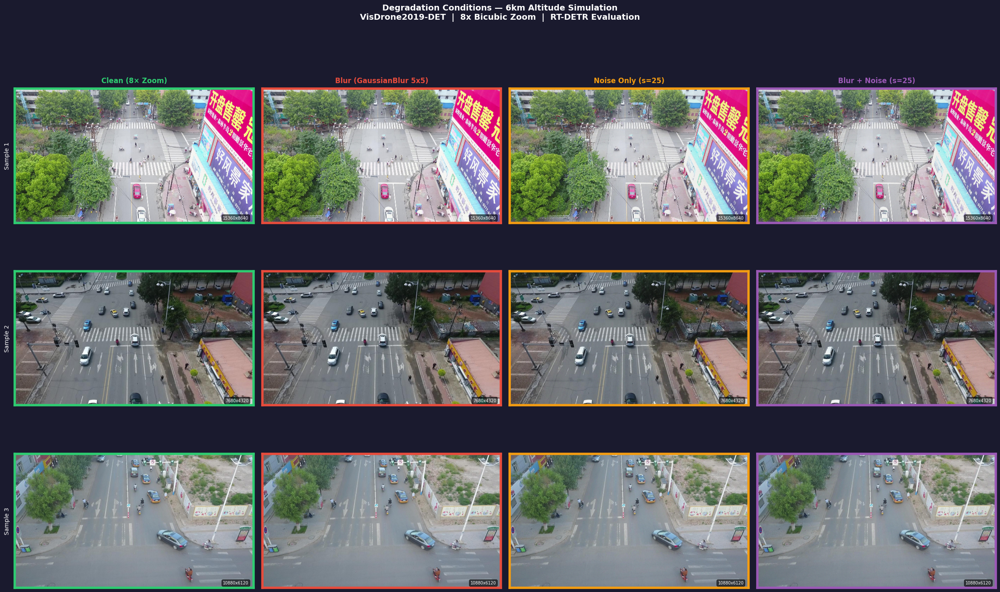

Saved to /kaggle/working/degradation_visual.png


In [38]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

WORK_DIR  = Path("/kaggle/working")
ZOOM_DIR  = WORK_DIR / "dataset_zoomed"
BLUR_DIR  = WORK_DIR / "dataset_blur"
NOISE_DIR = WORK_DIR / "dataset_noise"
BN_DIR    = WORK_DIR / "dataset_blur_noise"

# ── Pick 3 sample images ──────────────────────────────────────
val_imgs = sorted((ZOOM_DIR / "val" / "images").glob("*.jpg"))
samples  = [val_imgs[0], val_imgs[len(val_imgs)//2], val_imgs[-1]]

print("Samples selected:")
for s in samples:
    print(f"  {s.name}")

CONDITIONS = [
    ("Clean (8× Zoom)",        ZOOM_DIR  / "val" / "images", "#2ECC71"),
    ("Blur (GaussianBlur 5x5)", BLUR_DIR  / "val" / "images", "#E74C3C"),
    ("Noise Only (s=25)",      NOISE_DIR / "val" / "images", "#F39C12"),
    ("Blur + Noise (s=25)",    BN_DIR    / "val" / "images", "#9B59B6"),
]

n_rows = len(samples)
n_cols = len(CONDITIONS)

fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(6 * n_cols, 5 * n_rows)
)
fig.patch.set_facecolor("#1A1A2E")

for row, sample_path in enumerate(samples):
    for col, (cond_name, img_dir, col_color) in enumerate(CONDITIONS):

        ax       = axes[row][col]
        img_path = img_dir / sample_path.name

        if not img_path.exists():
            ax.text(
                0.5, 0.5, "Not Found",
                ha="center", va="center",
                color="white", fontsize=12,
                transform=ax.transAxes
            )
            ax.set_facecolor("#2C2C2C")
            ax.axis("off")
            continue

        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img)

        for spine in ax.spines.values():
            spine.set_edgecolor(col_color)
            spine.set_linewidth(4)

        if row == 0:
            ax.set_title(
                cond_name,
                fontsize=12,
                fontweight="bold",
                color=col_color,
                pad=10
            )

        if col == 0:
            ax.set_ylabel(
                f"Sample {row + 1}",
                fontsize=10,
                color="white",
                labelpad=8
            )

        H, W = img.shape[:2]
        ax.text(
            0.98, 0.02,
            f"{W}x{H}",
            ha="right", va="bottom",
            color="white", fontsize=7,
            transform=ax.transAxes,
            bbox=dict(
                boxstyle="round",
                facecolor="black",
                alpha=0.6
            )
        )

        ax.tick_params(
            left=False, bottom=False,
            labelleft=False, labelbottom=False
        )

plt.suptitle(
    "Degradation Conditions — 6km Altitude Simulation\n"
    "VisDrone2019-DET  |  8x Bicubic Zoom  |  RT-DETR Evaluation",
    fontsize=14,
    fontweight="bold",
    color="white",
    y=1.01
)

plt.tight_layout(pad=1.5)

save_path = WORK_DIR / "degradation_visual.png"
plt.savefig(
    str(save_path),
    dpi=150,
    bbox_inches="tight",
    facecolor="#1A1A2E"
)
plt.show()
print(f"Saved to {save_path}")

 Most object-dense image: 0000086_01954_d_0000005 (173 objects)
   Image size: 7680 × 4320
   Crop region: (1444,139) → (3364,1219)
   Crop size  : 1920 × 1080


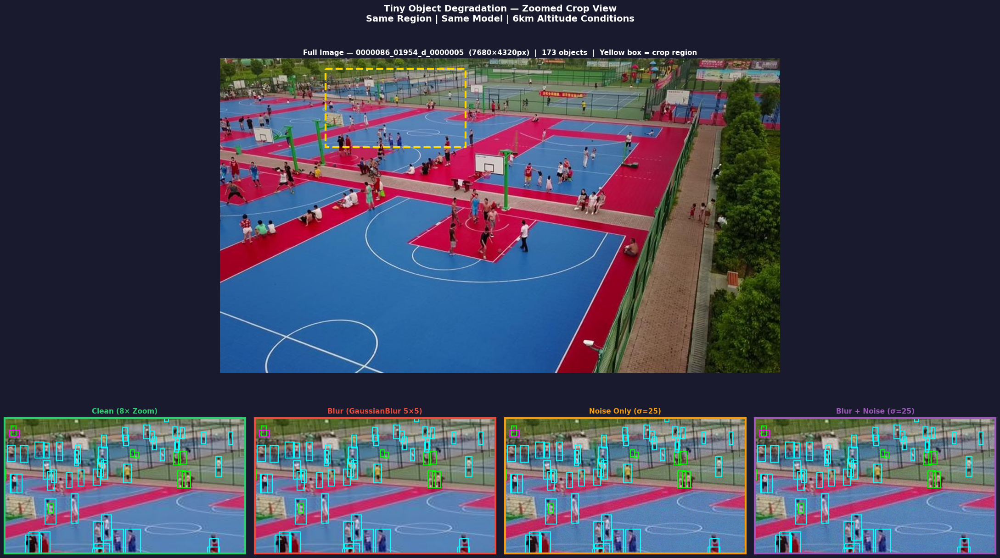

 Saved → /kaggle/working/degradation_crop_comparison.png


In [39]:
# ============================================================
# CELL — Zoomed crop comparison of a tiny object region
# Picks the most object-dense image and crops a small region
# so you can actually SEE the degradation on tiny objects
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path

WORK_DIR  = Path("/kaggle/working")
ZOOM_DIR  = WORK_DIR / "dataset_zoomed"
BLUR_DIR  = WORK_DIR / "dataset_blur"
NOISE_DIR = WORK_DIR / "dataset_noise"
BN_DIR    = WORK_DIR / "dataset_blur_noise"

# ── Find image with most labels (most objects) ────────────────
lbl_dir  = ZOOM_DIR / "val" / "labels"
all_lbls = list(lbl_dir.glob("*.txt"))

best_stem  = None
best_count = 0
for lbl in all_lbls:
    lines = [l for l in open(lbl).read().strip().split("\n") if l]
    if len(lines) > best_count:
        best_count = len(lines)
        best_stem  = lbl.stem

print(f" Most object-dense image: {best_stem} ({best_count} objects)")

# ── Load all 4 versions ───────────────────────────────────────
def load_bgr2rgb(directory, stem):
    for ext in [".jpg", ".png"]:
        p = Path(directory) / f"{stem}{ext}"
        if p.exists():
            img = cv2.imread(str(p))
            return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    raise FileNotFoundError(f"{stem} not found in {directory}")

img_clean = load_bgr2rgb(ZOOM_DIR  / "val" / "images", best_stem)
img_blur  = load_bgr2rgb(BLUR_DIR  / "val" / "images", best_stem)
img_noise = load_bgr2rgb(NOISE_DIR / "val" / "images", best_stem)
img_bn    = load_bgr2rgb(BN_DIR    / "val" / "images", best_stem)

H, W = img_clean.shape[:2]
print(f"   Image size: {W} × {H}")

# ── Read labels and find crop region with most objects ────────
lbl_path = lbl_dir / f"{best_stem}.txt"
boxes    = []
for line in open(lbl_path).read().strip().split("\n"):
    parts = line.strip().split()
    if len(parts) != 5:
        continue
    cls, cx, cy, bw, bh = int(parts[0]), float(parts[1]), \
                           float(parts[2]), float(parts[3]), float(parts[4])
    x1 = int((cx - bw/2) * W)
    y1 = int((cy - bh/2) * H)
    x2 = int((cx + bw/2) * W)
    y2 = int((cy + bh/2) * H)
    boxes.append((cls, x1, y1, x2, y2))

# Define crop around centre of all boxes
if boxes:
    all_cx = [(b[1]+b[3])//2 for b in boxes]
    all_cy = [(b[2]+b[4])//2 for b in boxes]
    centre_x = int(np.median(all_cx))
    centre_y = int(np.median(all_cy))
else:
    centre_x, centre_y = W//2, H//2

# Crop size — 25% of image
crop_w = W // 4
crop_h = H // 4
x1c = max(0, centre_x - crop_w//2)
y1c = max(0, centre_y - crop_h//2)
x2c = min(W, x1c + crop_w)
y2c = min(H, y1c + crop_h)

print(f"   Crop region: ({x1c},{y1c}) → ({x2c},{y2c})")
print(f"   Crop size  : {x2c-x1c} × {y2c-y1c}")

def crop(img):
    return img[y1c:y2c, x1c:x2c]

crops = [
    ("Clean (8× Zoom)",       crop(img_clean), "#2ECC71"),
    ("Blur (GaussianBlur 5×5)", crop(img_blur), "#E74C3C"),
    ("Noise Only (σ=25)",     crop(img_noise), "#F39C12"),
    ("Blur + Noise (σ=25)",   crop(img_bn),    "#9B59B6"),
]

# ── Full image with crop box shown ────────────────────────────
fig = plt.figure(figsize=(22, 14))
fig.patch.set_facecolor("#1A1A2E")

# Top row — full image with crop rectangle marked
ax_full = fig.add_subplot(2, 4, (1, 4))
ax_full.imshow(img_clean)
rect = patches.Rectangle(
    (x1c, y1c), x2c-x1c, y2c-y1c,
    linewidth=3, edgecolor="#FFD700",
    facecolor="none", linestyle="--"
)
ax_full.add_patch(rect)
ax_full.set_title(f"Full Image — {best_stem}  "
                  f"({W}×{H}px)  |  {best_count} objects  "
                  f"|  Yellow box = crop region",
                  color="white", fontsize=11, fontweight="bold")
ax_full.axis("off")

# Bottom row — 4 cropped versions
for i, (title, crop_img, color) in enumerate(crops):
    ax = fig.add_subplot(2, 4, 5 + i)
    ax.imshow(crop_img)
    ax.set_title(title, color=color,
                 fontsize=11, fontweight="bold", pad=8)

    for spine in ax.spines.values():
        spine.set_edgecolor(color)
        spine.set_linewidth(3)

    # Draw boxes on crop
    NAMES  = {0:"ped",1:"ppl",2:"bike",3:"car",4:"tri",5:"moto"}
    COLS   = {0:"cyan",1:"lime",2:"yellow",3:"red",4:"orange",5:"magenta"}
    for cls, bx1, by1, bx2, by2 in boxes:
        # Adjust to crop coords
        rx1 = bx1 - x1c;  ry1 = by1 - y1c
        rx2 = bx2 - x1c;  ry2 = by2 - y1c
        # Only draw if box is inside crop
        if rx2 < 0 or ry2 < 0 or rx1 > (x2c-x1c) or ry1 > (y2c-y1c):
            continue
        rect2 = patches.Rectangle(
            (rx1, ry1), rx2-rx1, ry2-ry1,
            linewidth=1.5, edgecolor=COLS.get(cls,"white"),
            facecolor="none"
        )
        ax.add_patch(rect2)

    ax.tick_params(left=False, bottom=False,
                   labelleft=False, labelbottom=False)

plt.suptitle(
    "Tiny Object Degradation — Zoomed Crop View\n"
    "Same Region | Same Model | 6km Altitude Conditions",
    fontsize=14, fontweight="bold",
    color="white", y=1.01
)

plt.tight_layout(pad=1.5)
save_path = Path("/kaggle/working") / "degradation_crop_comparison.png"
plt.savefig(str(save_path), dpi=150,
            bbox_inches="tight",
            facecolor="#1A1A2E")
plt.show()
print(f" Saved → {save_path}")

In [40]:
# ── STEP 1: INSTALL REAL-ESRGAN ───────────────────────────────────────────────
!pip install -q basicsr facexlib gfpgan
!pip install -q realesrgan

# Download the ESRGAN model weights
import urllib.request
from pathlib import Path

ESRGAN_WEIGHTS_DIR = Path("/kaggle/working/esrgan_weights")
ESRGAN_WEIGHTS_DIR.mkdir(exist_ok=True)
ESRGAN_MODEL_PATH  = ESRGAN_WEIGHTS_DIR / "RealESRGAN_x4plus.pth"

if not ESRGAN_MODEL_PATH.exists():
    print("Downloading RealESRGAN weights...")
    urllib.request.urlretrieve(
        "https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.0/RealESRGAN_x4plus.pth",
        ESRGAN_MODEL_PATH
    )
    print("Done.")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.5/172.5 kB 9.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 11.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.6/59.6 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.2/52.2 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 333.1/333.1 kB 18.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 108.0 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 11.4 MB/s eta 0:00:00
Done.


In [49]:
# ── STEP 1: FIX INSTALL ───────────────────────────────────────────────────────
!pip install -q basicsr realesrgan

# Patch the broken torchvision import directly
import pathlib

deg_file = pathlib.Path("/usr/local/lib/python3.12/dist-packages/basicsr/data/degradations.py")

old_line = "from torchvision.transforms.functional_tensor import rgb_to_grayscale"
new_line = "from torchvision.transforms.functional import rgb_to_grayscale"

text = deg_file.read_text()
if old_line in text:
    deg_file.write_text(text.replace(old_line, new_line))
    print(" Patch applied.")
elif new_line in text:
    print(" Already patched.")
else:
    print("  Line not found — check the file manually.")
    print(deg_file.read_text()[:500])

 Patch applied.


In [50]:

# ── STEP 2: VERIFY ────────────────────────────────────────────────────────────
try:
    from realesrgan import RealESRGANer
    from basicsr.archs.rrdbnet_arch import RRDBNet
    print(" Imports OK.")
except Exception as e:
    print(f" {e}")

 Imports OK.


In [52]:
import cv2, torch, urllib.request, shutil
from pathlib import Path
from tqdm import tqdm
from realesrgan import RealESRGANer
from basicsr.archs.rrdbnet_arch import RRDBNet

VAL_IMAGES_DIR = Path("/kaggle/input/datasets/arnavdsp/visdrone2019-det-filtered-tiny-object-images/filtered_tiny/val_images")
ESRGAN_OUT_DIR = Path("/kaggle/working/val_esrgan")
ESRGAN_OUT_DIR.mkdir(exist_ok=True)

# ── Check disk space first ─────────────────────────────────────────────────────
import shutil as sh
total, used, free = sh.disk_usage("/kaggle/working")
print(f"Disk — Total: {total/1e9:.1f}GB  Used: {used/1e9:.1f}GB  Free: {free/1e9:.1f}GB")

# ── Free up space by removing any large cached files ──────────────────────────
import os
for pattern in ["/kaggle/working/**/*.pt", "/kaggle/working/**/*.zip"]:
    import glob
    for f in glob.glob(pattern, recursive=True):
        size = os.path.getsize(f) / 1e6
        # Only delete if NOT best.pt (keep your trained weights)
        if "best.pt" not in f and "last.pt" not in f:
            print(f"  Removing {f}  ({size:.0f} MB)")
            os.remove(f)

total, used, free = sh.disk_usage("/kaggle/working")
print(f"\nAfter cleanup — Free: {free/1e9:.1f}GB")

Disk — Total: 21.0GB  Used: 20.9GB  Free: 0.0GB
  Removing /kaggle/working/yolo26n.pt  (6 MB)
  Removing /kaggle/working/rtdetr-l.pt  (67 MB)
  Removing /kaggle/working/runs/rtdetr_zoomed_8x/weights/epoch5.pt  (264 MB)
  Removing /kaggle/working/runs/rtdetr_zoomed_8x/weights/epoch30.pt  (264 MB)
  Removing /kaggle/working/runs/rtdetr_zoomed_8x/weights/epoch35.pt  (264 MB)
  Removing /kaggle/working/runs/rtdetr_zoomed_8x/weights/epoch20.pt  (264 MB)
  Removing /kaggle/working/runs/rtdetr_zoomed_8x/weights/epoch10.pt  (264 MB)
  Removing /kaggle/working/runs/rtdetr_zoomed_8x/weights/epoch15.pt  (264 MB)
  Removing /kaggle/working/runs/rtdetr_zoomed_8x/weights/epoch45.pt  (264 MB)
  Removing /kaggle/working/runs/rtdetr_zoomed_8x/weights/epoch0.pt  (264 MB)
  Removing /kaggle/working/runs/rtdetr_zoomed_8x/weights/epoch25.pt  (264 MB)
  Removing /kaggle/working/runs/rtdetr_zoomed_8x/weights/epoch40.pt  (264 MB)

After cleanup — Free: 2.7GB


In [53]:
# ── Download weights to /tmp (separate partition, usually has space) ───────────
WEIGHTS_PATH = Path("/tmp/RealESRGAN_x4plus.pth")   # ← /tmp not /kaggle/working

if not WEIGHTS_PATH.exists():
    print("Downloading weights to /tmp...")
    urllib.request.urlretrieve(
        "https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.0/RealESRGAN_x4plus.pth",
        WEIGHTS_PATH
    )
    print(f" Saved to {WEIGHTS_PATH}  ({WEIGHTS_PATH.stat().st_size/1e6:.0f} MB)")
else:
    print(f"Already exists  ({WEIGHTS_PATH.stat().st_size/1e6:.0f} MB)")

 Saved to /tmp/RealESRGAN_x4plus.pth  (67 MB)


In [54]:
# ── Load ESRGAN and process images ────────────────────────────────────────────
esrgan_model = RRDBNet(
    num_in_ch=3, num_out_ch=3,
    num_feat=64, num_block=23,
    num_grow_ch=32, scale=4
)
upsampler = RealESRGANer(
    scale=4,
    model_path=str(WEIGHTS_PATH),
    model=esrgan_model,
    tile=128,          # smaller tile = less VRAM + less temp disk usage
    tile_pad=10,
    pre_pad=0,
    half=torch.cuda.is_available(),
    device="cuda" if torch.cuda.is_available() else "cpu",
)

img_paths = sorted(VAL_IMAGES_DIR.glob("*.jpg")) + \
            sorted(VAL_IMAGES_DIR.glob("*.png"))
print(f"Running ESRGAN on {len(img_paths)} images...")

failed = []
for img_path in tqdm(img_paths):
    out_path = ESRGAN_OUT_DIR / img_path.name
    if out_path.exists():
        continue

    # Check free space before each image — stop early if running low
    _, _, free = sh.disk_usage("/kaggle/working")
    if free < 200 * 1e6:   # stop if less than 200 MB left
        print(f"  Low disk space ({free/1e6:.0f} MB). Stopping early.")
        break

    img = cv2.imread(str(img_path), cv2.IMREAD_COLOR)
    if img is None:
        failed.append(img_path.name); continue
    try:
        enhanced, _ = upsampler.enhance(img, outscale=4)
        enhanced = cv2.resize(
            enhanced, (img.shape[1], img.shape[0]),
            interpolation=cv2.INTER_LANCZOS4
        )
        cv2.imwrite(str(out_path), enhanced)
    except Exception as e:
        print(f"  Failed {img_path.name}: {e}")
        failed.append(img_path.name)

processed = len(list(ESRGAN_OUT_DIR.glob("*.jpg")))
print(f" Enhanced: {processed}  Failed: {len(failed)}")

Running ESRGAN on 60 images...


  0%|          | 0/60 [00:00<?, ?it/s]

	Tile 1/135
	Tile 2/135
	Tile 3/135
	Tile 4/135
	Tile 5/135
	Tile 6/135
	Tile 7/135
	Tile 8/135
	Tile 9/135
	Tile 10/135
	Tile 11/135
	Tile 12/135
	Tile 13/135
	Tile 14/135
	Tile 15/135
	Tile 16/135
	Tile 17/135
	Tile 18/135
	Tile 19/135
	Tile 20/135
	Tile 21/135
	Tile 22/135
	Tile 23/135
	Tile 24/135
	Tile 25/135
	Tile 26/135
	Tile 27/135
	Tile 28/135
	Tile 29/135
	Tile 30/135
	Tile 31/135
	Tile 32/135
	Tile 33/135
	Tile 34/135
	Tile 35/135
	Tile 36/135
	Tile 37/135
	Tile 38/135
	Tile 39/135
	Tile 40/135
	Tile 41/135
	Tile 42/135
	Tile 43/135
	Tile 44/135
	Tile 45/135
	Tile 46/135
	Tile 47/135
	Tile 48/135
	Tile 49/135
	Tile 50/135
	Tile 51/135
	Tile 52/135
	Tile 53/135
	Tile 54/135
	Tile 55/135
	Tile 56/135
	Tile 57/135
	Tile 58/135
	Tile 59/135
	Tile 60/135
	Tile 61/135
	Tile 62/135
	Tile 63/135
	Tile 64/135
	Tile 65/135
	Tile 66/135
	Tile 67/135
	Tile 68/135
	Tile 69/135
	Tile 70/135
	Tile 71/135
	Tile 72/135
	Tile 73/135
	Tile 74/135
	Tile 75/135
	Tile 76/135
	Tile 77/135
	Tile 78

  2%|▏         | 1/60 [00:19<18:48, 19.12s/it]

	Tile 1/135
	Tile 2/135
	Tile 3/135
	Tile 4/135
	Tile 5/135
	Tile 6/135
	Tile 7/135
	Tile 8/135
	Tile 9/135
	Tile 10/135
	Tile 11/135
	Tile 12/135
	Tile 13/135
	Tile 14/135
	Tile 15/135
	Tile 16/135
	Tile 17/135
	Tile 18/135
	Tile 19/135
	Tile 20/135
	Tile 21/135
	Tile 22/135
	Tile 23/135
	Tile 24/135
	Tile 25/135
	Tile 26/135
	Tile 27/135
	Tile 28/135
	Tile 29/135
	Tile 30/135
	Tile 31/135
	Tile 32/135
	Tile 33/135
	Tile 34/135
	Tile 35/135
	Tile 36/135
	Tile 37/135
	Tile 38/135
	Tile 39/135
	Tile 40/135
	Tile 41/135
	Tile 42/135
	Tile 43/135
	Tile 44/135
	Tile 45/135
	Tile 46/135
	Tile 47/135
	Tile 48/135
	Tile 49/135
	Tile 50/135
	Tile 51/135
	Tile 52/135
	Tile 53/135
	Tile 54/135
	Tile 55/135
	Tile 56/135
	Tile 57/135
	Tile 58/135
	Tile 59/135
	Tile 60/135
	Tile 61/135
	Tile 62/135
	Tile 63/135
	Tile 64/135
	Tile 65/135
	Tile 66/135
	Tile 67/135
	Tile 68/135
	Tile 69/135
	Tile 70/135
	Tile 71/135
	Tile 72/135
	Tile 73/135
	Tile 74/135
	Tile 75/135
	Tile 76/135
	Tile 77/135
	Tile 78

  3%|▎         | 2/60 [00:36<17:36, 18.21s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


  5%|▌         | 3/60 [00:41<11:19, 11.93s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


  7%|▋         | 4/60 [00:45<08:20,  8.94s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


  8%|▊         | 5/60 [00:49<06:40,  7.28s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 10%|█         | 6/60 [00:54<05:39,  6.29s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 12%|█▏        | 7/60 [00:58<04:58,  5.64s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 13%|█▎        | 8/60 [01:02<04:31,  5.22s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 15%|█▌        | 9/60 [01:07<04:10,  4.92s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 17%|█▋        | 10/60 [01:11<03:56,  4.73s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 18%|█▊        | 11/60 [01:15<03:44,  4.58s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 20%|██        | 12/60 [01:19<03:35,  4.48s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 22%|██▏       | 13/60 [01:28<04:25,  5.64s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 23%|██▎       | 14/60 [01:32<04:00,  5.22s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 25%|██▌       | 15/60 [01:40<04:36,  6.15s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 27%|██▋       | 16/60 [01:49<04:59,  6.81s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 28%|██▊       | 17/60 [01:57<05:13,  7.28s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 30%|███       | 18/60 [02:05<05:20,  7.62s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 32%|███▏      | 19/60 [02:14<05:22,  7.86s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 33%|███▎      | 20/60 [02:22<05:20,  8.02s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 35%|███▌      | 21/60 [02:31<05:17,  8.14s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 37%|███▋      | 22/60 [02:39<05:11,  8.21s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 38%|███▊      | 23/60 [02:43<04:19,  7.02s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 40%|████      | 24/60 [02:47<03:42,  6.19s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 42%|████▏     | 25/60 [02:52<03:16,  5.62s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 43%|████▎     | 26/60 [02:56<02:57,  5.22s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 45%|████▌     | 27/60 [03:00<02:42,  4.93s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 47%|████▋     | 28/60 [03:05<02:31,  4.74s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 48%|████▊     | 29/60 [03:13<03:01,  5.84s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 50%|█████     | 30/60 [03:17<02:41,  5.37s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 52%|█████▏    | 31/60 [03:22<02:26,  5.05s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 53%|█████▎    | 32/60 [03:26<02:14,  4.82s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 55%|█████▌    | 33/60 [03:30<02:05,  4.66s/it]

	Tile 1/40
	Tile 2/40
	Tile 3/40
	Tile 4/40
	Tile 5/40
	Tile 6/40
	Tile 7/40
	Tile 8/40
	Tile 9/40
	Tile 10/40
	Tile 11/40
	Tile 12/40
	Tile 13/40
	Tile 14/40
	Tile 15/40
	Tile 16/40
	Tile 17/40
	Tile 18/40
	Tile 19/40
	Tile 20/40
	Tile 21/40
	Tile 22/40
	Tile 23/40
	Tile 24/40
	Tile 25/40
	Tile 26/40
	Tile 27/40
	Tile 28/40
	Tile 29/40
	Tile 30/40
	Tile 31/40
	Tile 32/40
	Tile 33/40
	Tile 34/40
	Tile 35/40
	Tile 36/40
	Tile 37/40
	Tile 38/40
	Tile 39/40
	Tile 40/40


 57%|█████▋    | 34/60 [03:34<01:58,  4.54s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 58%|█████▊    | 35/60 [03:43<02:22,  5.70s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 60%|██████    | 36/60 [03:51<02:36,  6.51s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 62%|██████▏   | 37/60 [04:00<02:42,  7.07s/it]

	Tile 1/135
	Tile 2/135
	Tile 3/135
	Tile 4/135
	Tile 5/135
	Tile 6/135
	Tile 7/135
	Tile 8/135
	Tile 9/135
	Tile 10/135
	Tile 11/135
	Tile 12/135
	Tile 13/135
	Tile 14/135
	Tile 15/135
	Tile 16/135
	Tile 17/135
	Tile 18/135
	Tile 19/135
	Tile 20/135
	Tile 21/135
	Tile 22/135
	Tile 23/135
	Tile 24/135
	Tile 25/135
	Tile 26/135
	Tile 27/135
	Tile 28/135
	Tile 29/135
	Tile 30/135
	Tile 31/135
	Tile 32/135
	Tile 33/135
	Tile 34/135
	Tile 35/135
	Tile 36/135
	Tile 37/135
	Tile 38/135
	Tile 39/135
	Tile 40/135
	Tile 41/135
	Tile 42/135
	Tile 43/135
	Tile 44/135
	Tile 45/135
	Tile 46/135
	Tile 47/135
	Tile 48/135
	Tile 49/135
	Tile 50/135
	Tile 51/135
	Tile 52/135
	Tile 53/135
	Tile 54/135
	Tile 55/135
	Tile 56/135
	Tile 57/135
	Tile 58/135
	Tile 59/135
	Tile 60/135
	Tile 61/135
	Tile 62/135
	Tile 63/135
	Tile 64/135
	Tile 65/135
	Tile 66/135
	Tile 67/135
	Tile 68/135
	Tile 69/135
	Tile 70/135
	Tile 71/135
	Tile 72/135
	Tile 73/135
	Tile 74/135
	Tile 75/135
	Tile 76/135
	Tile 77/135
	Tile 78

 63%|██████▎   | 38/60 [04:17<03:42, 10.12s/it]

	Tile 1/135
	Tile 2/135
	Tile 3/135
	Tile 4/135
	Tile 5/135
	Tile 6/135
	Tile 7/135
	Tile 8/135
	Tile 9/135
	Tile 10/135
	Tile 11/135
	Tile 12/135
	Tile 13/135
	Tile 14/135
	Tile 15/135
	Tile 16/135
	Tile 17/135
	Tile 18/135
	Tile 19/135
	Tile 20/135
	Tile 21/135
	Tile 22/135
	Tile 23/135
	Tile 24/135
	Tile 25/135
	Tile 26/135
	Tile 27/135
	Tile 28/135
	Tile 29/135
	Tile 30/135
	Tile 31/135
	Tile 32/135
	Tile 33/135
	Tile 34/135
	Tile 35/135
	Tile 36/135
	Tile 37/135
	Tile 38/135
	Tile 39/135
	Tile 40/135
	Tile 41/135
	Tile 42/135
	Tile 43/135
	Tile 44/135
	Tile 45/135
	Tile 46/135
	Tile 47/135
	Tile 48/135
	Tile 49/135
	Tile 50/135
	Tile 51/135
	Tile 52/135
	Tile 53/135
	Tile 54/135
	Tile 55/135
	Tile 56/135
	Tile 57/135
	Tile 58/135
	Tile 59/135
	Tile 60/135
	Tile 61/135
	Tile 62/135
	Tile 63/135
	Tile 64/135
	Tile 65/135
	Tile 66/135
	Tile 67/135
	Tile 68/135
	Tile 69/135
	Tile 70/135
	Tile 71/135
	Tile 72/135
	Tile 73/135
	Tile 74/135
	Tile 75/135
	Tile 76/135
	Tile 77/135
	Tile 78

 65%|██████▌   | 39/60 [04:34<04:16, 12.22s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 67%|██████▋   | 40/60 [04:42<03:41, 11.06s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 68%|██████▊   | 41/60 [04:51<03:15, 10.26s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 70%|███████   | 42/60 [04:59<02:54,  9.70s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 72%|███████▏  | 43/60 [05:07<02:38,  9.30s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 73%|███████▎  | 44/60 [05:16<02:24,  9.02s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 75%|███████▌  | 45/60 [05:24<02:12,  8.84s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 77%|███████▋  | 46/60 [05:33<02:01,  8.71s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 78%|███████▊  | 47/60 [05:41<01:52,  8.62s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 80%|████████  | 48/60 [05:49<01:42,  8.55s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 82%|████████▏ | 49/60 [05:58<01:33,  8.51s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 83%|████████▎ | 50/60 [06:06<01:24,  8.46s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 85%|████████▌ | 51/60 [06:15<01:15,  8.44s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 87%|████████▋ | 52/60 [06:23<01:07,  8.42s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 88%|████████▊ | 53/60 [06:31<00:58,  8.42s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 90%|█████████ | 54/60 [06:40<00:50,  8.40s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 92%|█████████▏| 55/60 [06:48<00:41,  8.39s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 93%|█████████▎| 56/60 [06:56<00:33,  8.37s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 95%|█████████▌| 57/60 [07:05<00:25,  8.37s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 97%|█████████▋| 58/60 [07:13<00:16,  8.36s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


 98%|█████████▊| 59/60 [07:22<00:08,  8.36s/it]

	Tile 1/66
	Tile 2/66
	Tile 3/66
	Tile 4/66
	Tile 5/66
	Tile 6/66
	Tile 7/66
	Tile 8/66
	Tile 9/66
	Tile 10/66
	Tile 11/66
	Tile 12/66
	Tile 13/66
	Tile 14/66
	Tile 15/66
	Tile 16/66
	Tile 17/66
	Tile 18/66
	Tile 19/66
	Tile 20/66
	Tile 21/66
	Tile 22/66
	Tile 23/66
	Tile 24/66
	Tile 25/66
	Tile 26/66
	Tile 27/66
	Tile 28/66
	Tile 29/66
	Tile 30/66
	Tile 31/66
	Tile 32/66
	Tile 33/66
	Tile 34/66
	Tile 35/66
	Tile 36/66
	Tile 37/66
	Tile 38/66
	Tile 39/66
	Tile 40/66
	Tile 41/66
	Tile 42/66
	Tile 43/66
	Tile 44/66
	Tile 45/66
	Tile 46/66
	Tile 47/66
	Tile 48/66
	Tile 49/66
	Tile 50/66
	Tile 51/66
	Tile 52/66
	Tile 53/66
	Tile 54/66
	Tile 55/66
	Tile 56/66
	Tile 57/66
	Tile 58/66
	Tile 59/66
	Tile 60/66
	Tile 61/66
	Tile 62/66
	Tile 63/66
	Tile 64/66
	Tile 65/66
	Tile 66/66


100%|██████████| 60/60 [07:30<00:00,  7.51s/it]

 Enhanced: 60  Failed: 0


In [55]:
# ── STEP 4: COPY LABELS FOR ESRGAN VAL SET ───────────────────────────────────
import yaml, shutil
from pathlib import Path

WORK_DIR = Path("/kaggle/working")

# Read nc and names from your existing blur yaml
with open(WORK_DIR / "visdrone_blur.yaml") as f:
    blur_yaml = yaml.safe_load(f)

# Get original val labels path from the yaml
original_val_img_dir = Path(blur_yaml["path"]) / blur_yaml["val"].strip()
original_val_lbl_dir = Path(str(original_val_img_dir).replace("images", "labels"))

print(f"Val labels dir : {original_val_lbl_dir}")
print(f"Label files    : {len(list(original_val_lbl_dir.glob('*.txt')))}")

Val labels dir : /kaggle/working/dataset_blur/val/labels
Label files    : 60


In [56]:
# ── STEP 5: BUILD ESRGAN DATASET STRUCTURE ───────────────────────────────────
ESRGAN_OUT_DIR     = Path("/kaggle/working/val_esrgan")
ESRGAN_DATASET_DIR = WORK_DIR / "esrgan_dataset"

(ESRGAN_DATASET_DIR / "val" / "images").mkdir(parents=True, exist_ok=True)
(ESRGAN_DATASET_DIR / "val" / "labels").mkdir(parents=True, exist_ok=True)

# Copy ESRGAN-enhanced images
esrgan_imgs = sorted(ESRGAN_OUT_DIR.glob("*.jpg")) + \
              sorted(ESRGAN_OUT_DIR.glob("*.png"))
print(f"ESRGAN images available: {len(esrgan_imgs)}")

for p in tqdm(esrgan_imgs, desc="Copying images"):
    dst = ESRGAN_DATASET_DIR / "val" / "images" / p.name
    if not dst.exists():
        shutil.copy2(p, dst)

# Match and copy labels by stem
copied, missing = 0, 0
for p in esrgan_imgs:
    lbl_src = original_val_lbl_dir / (p.stem + ".txt")
    lbl_dst = ESRGAN_DATASET_DIR / "val" / "labels" / (p.stem + ".txt")
    if lbl_src.exists():
        shutil.copy2(lbl_src, lbl_dst)
        copied += 1
    else:
        lbl_dst.touch()   # empty label = background image
        missing += 1

print(f"Labels copied  : {copied}")
print(f"Empty labels   : {missing}")
print(f"Total val imgs : {len(list((ESRGAN_DATASET_DIR/'val'/'images').glob('*')))}")

ESRGAN images available: 60


Copying images: 100%|██████████| 60/60 [00:00<00:00, 2453.29it/s]

Labels copied  : 60
Empty labels   : 0
Total val imgs : 60


In [57]:
# ── STEP 6: WRITE ESRGAN YAML ─────────────────────────────────────────────────
nc    = blur_yaml["nc"]
names = blur_yaml["names"]

esrgan_yaml_path = WORK_DIR / "visdrone_esrgan.yaml"
esrgan_yaml_path.write_text(f"""path: {ESRGAN_DATASET_DIR.resolve()}
train: train/images
val:   val/images

nc: {nc}
names: {names}
""")
print(f"✅ YAML written: {esrgan_yaml_path}")
print(esrgan_yaml_path.read_text())

✅ YAML written: /kaggle/working/visdrone_esrgan.yaml
path: /kaggle/working/esrgan_dataset
train: train/images
val:   val/images

nc: 6
names: ['pedestrian', 'people', 'bicycle', 'car', 'tricycle', 'motor']



In [58]:
# ── STEP 7: EVALUATE ALL 5 CONDITIONS ────────────────────────────────────────
import os, torch
from ultralytics import RTDETR

# Auto-find best.pt
best_pt_paths = []
for root, dirs, files in os.walk(WORK_DIR):
    for file in files:
        if file == "best.pt":
            best_pt_paths.append(Path(root) / file)

if not best_pt_paths:
    raise FileNotFoundError("No best.pt found in /kaggle/working")

BEST_WEIGHTS = max(best_pt_paths, key=lambda p: p.stat().st_size)
print(f"Using weights: {BEST_WEIGHTS}  ({BEST_WEIGHTS.stat().st_size/1e6:.1f} MB)")

model = RTDETR(str(BEST_WEIGHTS))

EVAL_YAMLS = {
    "Blur Only"      : WORK_DIR / "visdrone_blur.yaml",
    "Noise Only"     : WORK_DIR / "visdrone_noise.yaml",
    "Blur+Noise"     : WORK_DIR / "visdrone_blur_noise.yaml",
    "ESRGAN Enhanced": esrgan_yaml_path,
}

RESULTS = {
    "Clean (8× Zoom)": {
        "mAP50"    : 0.0588,
        "mAP50-95" : 0.0221,
        "Precision": 0.2405,
        "Recall"   : 0.2871,
    }
}

device = 0 if torch.cuda.is_available() else "cpu"

for condition, yaml_path in EVAL_YAMLS.items():
    print(f"\n{'='*50}\n  Evaluating: {condition}\n{'='*50}")
    if not yaml_path.exists():
        print(f"  ⚠️  YAML not found: {yaml_path}")
        continue
    metrics = model.val(
        data    = str(yaml_path),
        split   = "val",
        imgsz   = 640,
        batch   = 4,
        device  = device,
        verbose = False,
    )
    RESULTS[condition] = {
        "mAP50"    : metrics.box.map50,
        "mAP50-95" : metrics.box.map,
        "Precision": metrics.box.mp,
        "Recall"   : metrics.box.mr,
    }
    print(f"  mAP@50    : {metrics.box.map50:.4f}")
    print(f"  mAP@50-95 : {metrics.box.map:.4f}")
    print(f"  Precision : {metrics.box.mp:.4f}")
    print(f"  Recall    : {metrics.box.mr:.4f}")

Using weights: /kaggle/working/runs/rtdetr_zoomed_8x/weights/best.pt  (66.2 MB)

  Evaluating: Blur Only
Ultralytics 8.4.53 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
rt-detr-l summary: 310 layers, 31,996,070 parameters, 0 gradients, 103.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4156.2±1072.0 MB/s, size: 4815.1 KB)
val: Scanning /kaggle/working/dataset_blur/val/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 60/60 14.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 15/15 1.4it/s 10.5s.3s
                   all         60       2500      0.235      0.292     0.0595     0.0222
Speed: 2.0ms preprocess, 92.6ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to /kaggle/working/runs/detect/val-5
  mAP@50    : 0.0595
  mAP@50-95 : 0.0222
  Precision : 0.2346
  Recall    : 0.2923

  Evaluating: Noise Only
Ultralytics 8.4.53 🚀 Python-3.12.12 torch-

In [59]:
# ── STEP 8: RESULTS TABLE ─────────────────────────────────────────────────────
print("\n" + "="*65)
print("  COMPLETE RESULTS — ALL 5 CONDITIONS")
print("="*65)
print(f"  {'Condition':<22} {'mAP@50':>8} {'mAP50-95':>10} "
      f"{'Precision':>11} {'Recall':>8} {'Δ mAP@50':>10}")
print("  " + "-"*70)

baseline = RESULTS["Clean (8× Zoom)"]["mAP50"]
for k, v in RESULTS.items():
    delta = f"{v['mAP50'] - baseline:+.4f}" if k != "Clean (8× Zoom)" else "  baseline"
    print(f"  {k:<22} {v['mAP50']:>8.4f} "
          f"{v['mAP50-95']:>10.4f} "
          f"{v['Precision']:>11.4f} "
          f"{v['Recall']:>8.4f} "
          f"{delta:>10}")
print("="*65)


  COMPLETE RESULTS — ALL 5 CONDITIONS
  Condition                mAP@50   mAP50-95   Precision   Recall   Δ mAP@50
  ----------------------------------------------------------------------
  Clean (8× Zoom)          0.0588     0.0221      0.2405   0.2871   baseline
  Blur Only                0.0595     0.0222      0.2346   0.2923    +0.0007
  Noise Only               0.0509     0.0192      0.2426   0.2549    -0.0079
  Blur+Noise               0.0503     0.0190      0.2420   0.2389    -0.0085
  ESRGAN Enhanced          0.0601     0.0221      0.2360   0.2909    +0.0013


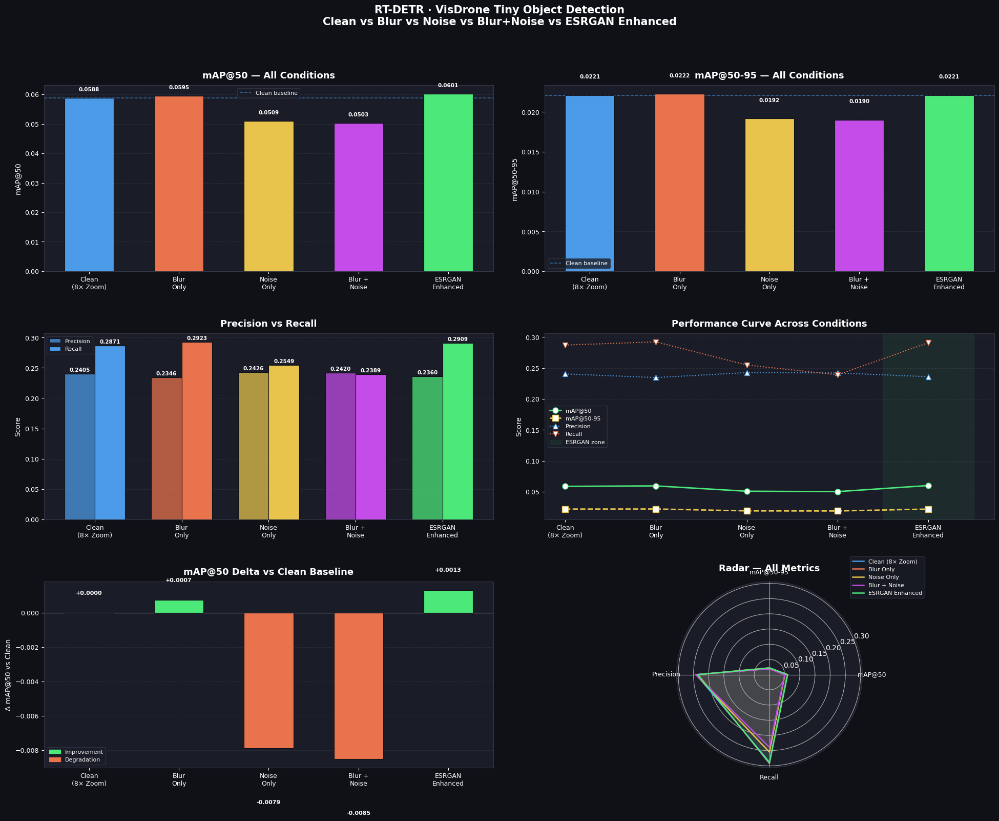

✅ Saved to /kaggle/working/all_conditions_comparison.png


In [60]:
# ── STEP 9: PLOT ALL 5 CONDITIONS ────────────────────────────────────────────
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

CONDITIONS = [
    "Clean\n(8× Zoom)",
    "Blur\nOnly",
    "Noise\nOnly",
    "Blur +\nNoise",
    "ESRGAN\nEnhanced",
]
RESULT_KEYS = [
    "Clean (8× Zoom)",
    "Blur Only",
    "Noise Only",
    "Blur+Noise",
    "ESRGAN Enhanced",
]

# Safely pull values — falls back to 0 if a condition wasn't evaluated
def get(key, metric):
    return RESULTS.get(key, {}).get(metric, 0.0)

map50     = [get(k, "mAP50")     for k in RESULT_KEYS]
map5095   = [get(k, "mAP50-95")  for k in RESULT_KEYS]
precision = [get(k, "Precision") for k in RESULT_KEYS]
recall    = [get(k, "Recall")    for k in RESULT_KEYS]

COLORS = ["#4C9BE8", "#E8734C", "#E8C44C", "#C44CE8", "#4CE87A"]
x      = np.arange(len(CONDITIONS))
W      = 0.35

fig = plt.figure(figsize=(20, 16))
fig.patch.set_facecolor("#0F1117")
plt.rcParams.update({
    "text.color"      : "white",
    "axes.labelcolor" : "white",
    "xtick.color"     : "white",
    "ytick.color"     : "white",
})

def styled_ax(ax, title):
    ax.set_facecolor("#1A1D27")
    ax.set_title(title, color="white", fontsize=13,
                 fontweight="bold", pad=10)
    ax.spines[["top","right","left","bottom"]].set_color("#333644")
    ax.yaxis.grid(True, color="#2A2D3A", linewidth=0.8, linestyle="--")
    ax.set_axisbelow(True)
    ax.tick_params(colors="white", labelsize=9)

def bar_labels(ax, bars):
    for bar in bars:
        h = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, h + 0.002,
                f"{h:.4f}", ha="center", va="bottom",
                color="white", fontsize=7.5, fontweight="bold")

# Plot 1: mAP@50
ax1 = fig.add_subplot(3, 2, 1)
bars1 = ax1.bar(x, map50, color=COLORS, width=0.55,
                edgecolor="#0F1117", linewidth=0.8, zorder=3)
bar_labels(ax1, bars1)
ax1.axhline(map50[0], color="#4C9BE8", linestyle="--",
            linewidth=1.2, alpha=0.6, label="Clean baseline")
ax1.set_xticks(x); ax1.set_xticklabels(CONDITIONS, fontsize=9)
ax1.set_ylabel("mAP@50", fontsize=10)
styled_ax(ax1, "mAP@50 — All Conditions")
ax1.legend(fontsize=8, facecolor="#1A1D27",
           labelcolor="white", edgecolor="#333644")

# Plot 2: mAP@50-95
ax2 = fig.add_subplot(3, 2, 2)
bars2 = ax2.bar(x, map5095, color=COLORS, width=0.55,
                edgecolor="#0F1117", linewidth=0.8, zorder=3)
bar_labels(ax2, bars2)
ax2.axhline(map5095[0], color="#4C9BE8", linestyle="--",
            linewidth=1.2, alpha=0.6, label="Clean baseline")
ax2.set_xticks(x); ax2.set_xticklabels(CONDITIONS, fontsize=9)
ax2.set_ylabel("mAP@50-95", fontsize=10)
styled_ax(ax2, "mAP@50-95 — All Conditions")
ax2.legend(fontsize=8, facecolor="#1A1D27",
           labelcolor="white", edgecolor="#333644")

# Plot 3: Precision & Recall grouped
ax3 = fig.add_subplot(3, 2, 3)
bp = ax3.bar(x - W/2, precision, width=W, label="Precision",
             color=[c + "BB" for c in COLORS],
             edgecolor="#0F1117", linewidth=0.8, zorder=3)
br = ax3.bar(x + W/2, recall,    width=W, label="Recall",
             color=COLORS, edgecolor="#0F1117", linewidth=0.8, zorder=3)
bar_labels(ax3, bp); bar_labels(ax3, br)
ax3.set_xticks(x); ax3.set_xticklabels(CONDITIONS, fontsize=9)
ax3.set_ylabel("Score", fontsize=10)
styled_ax(ax3, "Precision vs Recall")
ax3.legend(fontsize=8, facecolor="#1A1D27",
           labelcolor="white", edgecolor="#333644")

# Plot 4: Degradation + recovery line chart
ax4 = fig.add_subplot(3, 2, 4)
ax4.plot(CONDITIONS, map50,    "o-",  color="#4CE87A", linewidth=2,
         markersize=8, markerfacecolor="white", label="mAP@50")
ax4.plot(CONDITIONS, map5095,  "s--", color="#E8C44C", linewidth=2,
         markersize=8, markerfacecolor="white", label="mAP@50-95")
ax4.plot(CONDITIONS, precision, "^:", color="#4C9BE8", linewidth=1.5,
         markersize=7, markerfacecolor="white", label="Precision")
ax4.plot(CONDITIONS, recall,    "v:", color="#E8734C", linewidth=1.5,
         markersize=7, markerfacecolor="white", label="Recall")
ax4.axvspan(3.5, 4.5, color="#4CE87A", alpha=0.07, label="ESRGAN zone")
styled_ax(ax4, "Performance Curve Across Conditions")
ax4.set_ylabel("Score", fontsize=10)
ax4.legend(fontsize=8, facecolor="#1A1D27",
           labelcolor="white", edgecolor="#333644")

# Plot 5: Delta vs clean
ax5 = fig.add_subplot(3, 2, 5)
deltas       = [m - map50[0] for m in map50]
delta_colors = ["#4CE87A" if d >= 0 else "#E8734C" for d in deltas]
bars5 = ax5.bar(x, deltas, color=delta_colors, width=0.55,
                edgecolor="#0F1117", linewidth=0.8, zorder=3)
ax5.axhline(0, color="white", linewidth=0.8, alpha=0.5)
for bar, d in zip(bars5, deltas):
    ax5.text(bar.get_x() + bar.get_width() / 2,
             d + (0.001 if d >= 0 else -0.003),
             f"{d:+.4f}", ha="center",
             va="bottom" if d >= 0 else "top",
             color="white", fontsize=8, fontweight="bold")
ax5.set_xticks(x); ax5.set_xticklabels(CONDITIONS, fontsize=9)
ax5.set_ylabel("Δ mAP@50 vs Clean", fontsize=10)
styled_ax(ax5, "mAP@50 Delta vs Clean Baseline")
ax5.legend(
    handles=[
        mpatches.Patch(color="#4CE87A", label="Improvement"),
        mpatches.Patch(color="#E8734C", label="Degradation"),
    ],
    fontsize=8, facecolor="#1A1D27",
    labelcolor="white", edgecolor="#333644"
)

# Plot 6: Radar
ax6 = fig.add_subplot(3, 2, 6, polar=True)
ax6.set_facecolor("#1A1D27")
METRICS = ["mAP@50", "mAP@50-95", "Precision", "Recall"]
angles  = np.linspace(0, 2 * np.pi, len(METRICS), endpoint=False).tolist()
angles += angles[:1]

radar_data = list(zip(map50, map5095, precision, recall))
for vals, cond, col in zip(radar_data, CONDITIONS, COLORS):
    v = list(vals) + [vals[0]]
    ax6.plot(angles, v, color=col, linewidth=1.8,
             label=cond.replace("\n", " "))
    ax6.fill(angles, v, color=col, alpha=0.08)

ax6.set_xticks(angles[:-1])
ax6.set_xticklabels(METRICS, color="white", fontsize=9)
ax6.tick_params(colors="white")
ax6.spines["polar"].set_color("#333644")
ax6.set_title("Radar — All Metrics", color="white",
              fontsize=13, fontweight="bold", pad=15)
ax6.legend(loc="upper right", bbox_to_anchor=(1.35, 1.15),
           fontsize=8, facecolor="#1A1D27",
           labelcolor="white", edgecolor="#333644")

plt.suptitle(
    "RT-DETR · VisDrone Tiny Object Detection\n"
    "Clean vs Blur vs Noise vs Blur+Noise vs ESRGAN Enhanced",
    color="white", fontsize=15, fontweight="bold", y=1.01
)
plt.tight_layout(pad=2.5)
plt.savefig("/kaggle/working/all_conditions_comparison.png",
            dpi=150, bbox_inches="tight", facecolor="#0F1117")
plt.show()
print("✅ Saved to /kaggle/working/all_conditions_comparison.png")